# Modules & Functions

In [1]:
import sys
import numpy as np
from scipy.stats import norm
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy import units as u
from astropy.coordinates import SkyCoord
from regions import CircleSkyRegion, RectangleSkyRegion
from gammapy.maps import WcsGeom, MapAxis, Map, WcsNDMap
from gammapy.makers import MapDatasetMaker, SafeMaskMaker, FoVBackgroundMaker
from gammapy.data import DataStore
from gammapy.datasets import Datasets, FluxPointsDataset, MapDataset
from gammapy.modeling import Fit
from gammapy.modeling.models import SkyModel, LogParabolaSpectralModel, PointSpatialModel, PowerLawSpectralModel, FoVBackgroundModel, Models, SmoothBrokenPowerLawSpectralModel
from gammapy.estimators import FluxPoints,FluxPointsEstimator, ExcessMapEstimator
%matplotlib inline
import sys, os
import numpy as np
import itertools
import re
import datetime
import gammapy
import time
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import json
from pathlib import Path
from astropy import units as u
from astropy.coordinates import SkyCoord
from gammapy.stats import CashCountsStatistic, cash, cash_sum_cython
from gammapy.maps import WcsGeom, MapAxis, Map
from gammapy.makers import MapDatasetMaker, SafeMaskMaker
from gammapy.data import DataStore, Observations
from gammapy.datasets import Datasets, FluxPointsDataset, MapDatasetOnOff
from gammapy.modeling import Fit
from gammapy.modeling.models import SkyModel, LogParabolaSpectralModel, PointSpatialModel, PowerLawSpectralModel, DiskSpatialModel, TemplateSpatialModel, PowerLawNormSpectralModel, BrokenPowerLawSpectralModel
from gammapy.datasets import Datasets, MapDataset
from regions import CircleSkyRegion, RectangleSkyRegion, EllipseSkyRegion
from gammapy.estimators import (
    FluxPoints,
    FluxPointsEstimator,
    EnergyDependentMorphologyEstimator)
# from common_utils import get_excluded_regions
#from gammapy.utils.regions import make_region
from gammapy.modeling.models import FoVBackgroundModel, GaussianSpatialModel, ShellSpatialModel, DiskSpatialModel, PiecewiseNormSpectralModel, GeneralizedGaussianSpatialModel, ExpCutoffPowerLawSpectralModel
from gammapy.makers import FoVBackgroundMaker
from gammapy.estimators import ExcessMapEstimator, TSMapEstimator, FluxMaps
from gammapy.maps import WcsNDMap
from gammapy.visualization import plot_npred_signal, plot_distribution
import ipywidgets
from gammapy.modeling.models import Models
from astropy.coordinates import Angle
from astropy.time import Time
from collections import OrderedDict
import glob
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import datetime
from scipy.stats import chi2, norm
from astropy.table import Table
import pandas as pd
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=RuntimeWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=UserWarning)
DB_general = pd.read_csv('/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/db_data.csv', header=0)
import sys  
sys.path.insert(1, '/home/hpc/caph/mppi103h/Documents/On-OFF-matching-woody')
from scipy.optimize import curve_fit
import common_utils
from common_utils import get_excluded_regions
from matplotlib.lines import Line2D
from PIL import Image
sys.path.insert(1, '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial')
import my_utility_functions as muf
PlotDir = '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/Plots/ON_OFF/Individual_matching/'

path_norms_and_tilts = '/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/bkg_estimation/tilt_and_norm/'
path_fits = '/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/bkg_estimation/fits/'


import os
import re
import math
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from astropy import table

In [2]:
import sys  
sys.path.insert(2, '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/Monogem_on_off_bkg/')

import runmatching_utilities as util

In [3]:
from importlib import reload
reload(util)
reload(muf)

<module 'my_utility_functions' from '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/my_utility_functions.py'>

In [4]:
import run_matching_algorithm as rma
reload(rma)

<module 'run_matching_algorithm' from '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/run_matching_algorithm.py'>

In [5]:
muon_phases2 = [20000, 40093, 57532, 60838, 63567, 68545, 80000, 85000, 95003, 100800, 110340, 127700, 128600, 132350, 154814, 190000]

DB_general = pd.read_csv(r'/home/wecapstor1/caph/shared/hess/fits/database_image/data_1223.csv', header=0)
correction_factor = pd.read_csv(r'/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/zenith_correction_factors.csv', sep='\t')

offset_max = 2*u.deg

In [6]:
def gauss_function(x, a, x0, sigma):
    return a*np.exp(-(x-x0)**2/(2*sigma**2))

def find_energy_threshold(dataset):
    number = 0
    for k in range(0,dataset.counts.data.shape[0]): 
        for l in range(0,dataset.counts.data.shape[1]):
            for n in range(0,dataset.counts.data.shape[2]):
                if dataset.mask_safe.data[k][l][n] == True:
                    number = k 
                    break
        if number != 0:
            break
    return number

def get_exclusion_mask(off_run, geom_off, radius, radius_source_mask):
    """ Define the exclusion mask that will be used for the background fit """ 
    
    hap_exclusion_regions = get_excluded_regions(geom_off.center_coord[0].value, geom_off.center_coord[1].value, radius)
    excl_regions = []
    for source in hap_exclusion_regions:
        center = SkyCoord(source.ra, source.dec, unit='deg', frame='icrs')
        region = CircleSkyRegion(center=center, radius=source.radius*u.deg)
        excl_regions.append(region)

    tel_pointing = off_run.pointing.fixed_icrs
    source_pos = DB_general[DB_general['Run']==off_run.obs_id]
    ra = tel_pointing.ra.value #- source_pos['Offset_x'].iloc[0]
    dec = tel_pointing.dec.value #- source_pos['Offset_y'].iloc[0]
    excl_regions.append(CircleSkyRegion(center=SkyCoord(ra*u.deg, dec*u.deg), radius=radius_source_mask*u.deg))
    
    data2 = geom_off.region_mask(regions=excl_regions, inside=False)
    maker_fov_off = FoVBackgroundMaker(method="fit", exclusion_mask=data2)
    ex = maker_fov_off.exclusion_mask.cutout(off_run.pointing.fixed_icrs, width=2 * offset_max)
    return maker_fov_off, ex

def adjust_energy_threshold(dataset, number):
    """ Apply a predifined save energy to the counts and background of a dataset """
    
    bkg_array = np.zeros_like(dataset.data)
    for a in range(number, bkg_array.shape[0]):
        for b in range(0,dataset.data.shape[1]):
            for c in range(0,dataset.data.shape[2]):
                bkg_array[a][b][c] = dataset.data[a][b][c]
    
    masked_data = WcsNDMap(geom=dataset.geom, data=np.array(bkg_array))
    return masked_data

def livetime_corr(obs, off_run, dataset):
    """ Correct for the differences in deadtime corrected observation time """
    
    livetime_dev = off_run.observation_live_time_duration.value - obs.observation_live_time_duration.value
    counts_per_sec = dataset.background.data/off_run.observation_live_time_duration.value
    factors = counts_per_sec*livetime_dev
    bkg = [x + y for x, y in zip(dataset.background.data, factors)]

    bkg = WcsNDMap(geom=dataset.counts.geom, data=np.array(bkg))
    dataset.background = bkg
    return dataset

    
def zenith_corr(obs, off_run, dataset):
    """ Correct for the differences in zenith angle """
    
    for phase in range(0,len(muon_phases2)-1):
        if obs.obs_id > muon_phases2[phase] and obs.obs_id < muon_phases2[phase+1]:
            factor = correction_factor.x_2.iloc[phase]

    bkg = dataset.background.data
    zenith_off = np.deg2rad(ds_off.obs_table[ds_off.obs_table['OBS_ID']==off_run.obs_id]["ZEN_PNT"])
    zenith_on = np.deg2rad(ds_on.obs_table[ds_on.obs_table['OBS_ID']==obs.obs_id]["ZEN_PNT"])
    bkg = np.array(bkg) * np.cos(zenith_on - zenith_off)**factor
    
    bkg = WcsNDMap(geom=dataset.counts.geom, data=np.array(bkg))
    dataset.background = bkg
    return dataset

def systematics(obs, off_run, dataset, sys):
    """ Get the upper or lower limit of the background rate from the systematic error on the background template and run matching """
    run_dev = self.deviation[self.obs_list.index(obs)]
    bkg = dataset.background.data
    binsz = (self.systematic_shift['run dev'].iloc[1] - self.systematic_shift['run dev'].iloc[0])/2
    for i in range(0,len(self.systematic_shift)):
        if run_dev > self.systematic_shift['run dev'].iloc[i]-binsz and run_dev < self.systematic_shift['run dev'].iloc[i]+binsz:
            index = i
            sys_factor = self.systematic_shift['sys dev error'].iloc[i]
            if sys_factor == 0:
                closest_filled = index - min((index - self.systematic_shift[self.systematic_shift['sys dev'] != 0].index), key=abs)
                sys_factor = self.systematic_shift['sys dev error'].iloc[closest_filled]
        
        elif run_dev < self.systematic_shift['run dev'].iloc[0]:
            sys_factor = self.systematic_shift['sys dev error'].iloc[0]

        elif run_dev > self.systematic_shift['run dev'].iloc[-1]:
            sys_factor = self.systematic_shift['sys dev error'].iloc[-1]
    
    if sys == 'low':
        bkg = [x - x*sys_factor for x in bkg] 
    elif sys == 'high':
        bkg = [x + x*sys_factor for x in bkg]   
    
    bkg = WcsNDMap(geom=dataset.counts.geom, data=np.array(bkg))
    dataset.background = bkg
    return dataset

In [7]:
# Function to find better matches
def refine_matches(df, first_match_df, excluded_off_run_ids, used_off_runs, excess_threshold):
    on_run_ids_needing_better_matches = set()

    # Identify On_run_ids that need better matches
    for _, row in first_match_df.iterrows():
        if row['Excess'] < excess_threshold:
            on_run_ids_needing_better_matches.add(row['On_run_id'])

    # Remove the pairs with Excess < -100 from first_match_df
    first_match_df = first_match_df[first_match_df['Excess'] >= excess_threshold]

    # Iterate through each On_run_id that needs a better match
    for on_run_id in on_run_ids_needing_better_matches:
        # Filter the original DataFrame for the current On_run_id, excluding used Off_run_ids
        on_df = df[(df['On_run_id'] == on_run_id) & (~df['Off_run_id'].isin(used_off_runs))]

        # If there are no remaining Off_run_ids for this On_run_id, skip it
        if on_df.empty:
            continue

        # Sort the rows by score to find the best remaining matches
        sorted_on_df = on_df.sort_values(by='Score')

        # Try to find a better match
        for _, best_row in sorted_on_df.iterrows():
            off_run_id = best_row['Off_run_id']

            # Skip if the Off_run_id is in the excluded list
            if off_run_id in excluded_off_run_ids:
                continue

            # Skip if the Off_run_id has already been used
            if off_run_id in used_off_runs:
                continue

            # Add the new best match to first_match_df
            first_match_df = pd.concat([first_match_df, pd.DataFrame([best_row])], ignore_index=True)

            # Mark this Off_run_id as used
            used_off_runs.add(off_run_id)

            # Break after finding a valid match
            break

    return first_match_df, used_off_runs

# Define the scoring function
def calculate_score(row):
    # Weighted combination of Norm, Tilt, and Deviation
    score = abs(row['Norm'] - 1) + abs(row['Tilt']) #+ abs(row['Std_off'] - 1) + + abs(row['Mu_off']) # + abs(row['Deviation']) 
    # score = abs(row['Deviation']) 
    return score

def plot_spectrum(model, flux_points, energy_power, label, color):
    spec = model.spectral_model
    energy_range = [.1, 100] * u.TeV
    
    if energy_power == 0:
        # Plot the model spectrum
        spec.plot(energy_bounds=energy_range, energy_power=energy_power, label=label, color=color)
        spec.plot_error(energy_bounds=energy_range, energy_power=energy_power, color=color)
        
        # Plot the flux points
        flux_points.plot(energy_power=energy_power, color=color)
        
        # Set the ylabel dynamically based on energy_power
        plt.ylabel(r'dN/dE [TeV cm$^{-2}$ s$^{-1}$]')
        plt.grid()
        plt.xlim(1e-1,1e2)

    else:   
        # Plot the model spectrum
        spec.plot(energy_bounds=energy_range, energy_power=energy_power, label=label, color=color)
        spec.plot_error(energy_bounds=energy_range, energy_power=energy_power, color=color)
        
        # Plot the flux points
        flux_points.plot(energy_power=energy_power, color=color)
        
        # Set the ylabel dynamically based on energy_power
        plt.ylabel(r'E$^{%d}$ dN/dE [TeV cm$^{-2}$ s$^{-1}$]' % energy_power)
        plt.xlim(1e-1,1e2)

def chi2_(A, B):
    chi = np.sum([((a - b) ** 2) / (b) for (a, b) in zip(A, B)])
    return chi

def chi_squared_calculator(flux_point_data, flux_names):
    results_dict = {}
    for flux_name, flux_point_data in zip(flux_names, flux_points_container):
        mask = np.isfinite(flux_point_data.e2dnde.data[:, 0, 0]) & (flux_point_data.e2dnde.data[:, 0, 0] > 1e-14)
        data = flux_point_data.e2dnde.data[mask][:,0][:,0]
        ref_energy = np.array(flux_point_data.e2dnde_ref[mask])[:,0][:,0]
        
        # Calculate the chi-squared result
        result = chi2_(data, ref_energy)
        
        # Extract the exponent part of the result
        exponent = np.floor(np.log10(abs(result)))
        
        # Automate the multiplier based on the exponent
        result *= 10**(-exponent)
        
        # Store the result in the dictionary
        results_dict[flux_name] = result

    return results_dict

In [8]:
def gaussian(x, amplitude, mean, stddev):
    """
    Gaussian function.
    
    Parameters:
    - x: Independent variable
    - amplitude: Peak value of the Gaussian
    - mean: Mean (center) of the Gaussian
    - stddev: Standard deviation (width) of the Gaussian
    
    Returns:
    - Gaussian function values
    """
    return amplitude * np.exp(-0.5 * ((x - mean) / stddev) ** 2)

def fit_gaussian(x_data, y_data):
    """
    Fits a Gaussian normal distribution to the given data.
    
    Parameters:
    - x_data: Array of x values
    - y_data: Array of y values
    
    Returns:
    - popt: Optimal values for the Gaussian parameters (amplitude, mean, stddev)
    - pcov: Covariance of the parameters
    """
    # Initial guess for the parameters: amplitude, mean, stddev
    initial_guess = [max(y_data), np.mean(x_data), np.std(x_data)]
    
    # Fit the Gaussian to the data
    popt, pcov = curve_fit(gaussian, x_data, y_data, p0=initial_guess)
    error = np.diag(np.sqrt(pcov))
    return popt, error

In [9]:
def find_energy_with_sensitivity(f_cubic, target_bias, initial_guess, delta_bias=0.01):  
    # Calculate energy for the target bias
    energy_found = fsolve(lambda x: f_cubic(x) - target_bias, initial_guess)[0]
    
    # Calculate energy for a slightly perturbed bias (plus and minus delta_bias)
    energy_high = fsolve(lambda x: f_cubic(x) - (target_bias + delta_bias), initial_guess)[0]
    energy_low = fsolve(lambda x: f_cubic(x) - (target_bias - delta_bias), initial_guess)[0]
    
    # The energy error is the half-range of energy found by perturbing the bias
    energy_error = abs(energy_high - energy_low) / 2
    
    return energy_found, energy_error

def energy_threshold_from_bias(_dataset_, _bias_percent_):
    # Obtain energy and bias data
    energy = np.array(_dataset_.edisp.get_edisp_kernel().axes["energy_true"].center)
    energy_min = _dataset_.energy_range_total[0].value
    bias = np.array(_dataset_.edisp.get_edisp_kernel().get_bias(energy))

    mask = (energy >= energy_min)
    x = energy[mask]
    y = bias[mask]

    # Create a cubic spline interpolation function with extrapolation
    f_cubic = interp1d(x, y, kind='cubic', fill_value='extrapolate')

    bias_energy_below_5_percent_low, error_low = find_energy_with_sensitivity(f_cubic, _bias_percent_*1e-2, initial_guess=.25)

    return bias_energy_below_5_percent_low, error_low 

In [10]:
def plot_position(_ax_, ra, dec, name, _marker_):
    
    position = SkyCoord(ra, dec, frame='icrs', unit='deg')
    _ax_.text(position.ra.deg+.75, position.dec.deg+.05, name,color=_marker_['color'],transform=_ax_.get_transform('world'))
    _ax_.plot(position.ra.deg, position.dec.deg, **_marker_, transform=_ax_.get_transform('world'))

# Selecting Data

In [11]:
path_all_deg_new_code_df = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/individual_matching/results/new/all_deg_df_new.csv'

df = pd.read_csv(path_all_deg_new_code_df)
df = df.drop(columns=['Unnamed: 0'])

In [12]:
pd.set_option('display.float_format', lambda x: '%.5e' % x)  # Scientific notation
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.float_format', '{:.5f}'.format)

In [13]:
# Apply the scoring function to each row
df['Score'] = df.apply(calculate_score, axis=1)

df = df[df['On_run_id'] <= 180000]

# Define the list of Off_run_id values to exclude
excluded_off_run_ids = {171748, 171532, 171499, 171531, 171554,
                        #172228.00000, 163553.00000, 170869.00000, 171037.00000, 170315.00000, 170870.00000, 163245.00000, 173825.00000, 165948.00000, 183894.00000, 171036.00000, 163244.00000     
                       }  # Add your Off_run_id values here that have a bad trigger rate

# Initialize a list to store the best unique matches
best_matches = []

# Track which Off_run_ids have been used
used_off_runs = set()

#Define a set of special On_run_id values (already defined in your original code)
special_on_run_ids = {172067,165166,172090,165425,165305,172154,165272,165164,165271,165232,165395,165423,165394,165236,165168,165302,
                      172155,172156,165199,165268,172200,165193,165197,165274,165306,165398,165933,165429,165242,171631,172093,165936,
                      165201,165244,165203,165750,165963,165240,165807,165310,165308,171652,171611,165205,165839,171589,165170,165400,
                      165749,165427,165278,165810,165276,165746,165966,165842,165811}

# Compute the number of Off_run_ids per On_run_id
on_run_id_counts = df['On_run_id'].value_counts()

# Create a DataFrame for On_run_id counts and sort it by count
on_run_id_counts_df = on_run_id_counts.reset_index()
on_run_id_counts_df.columns = ['On_run_id', 'Count']
on_run_id_counts_df = on_run_id_counts_df.sort_values(by='Count')

# Iterate through each On_run_id in ascending order of Off_run_id counts
for on_run_id in on_run_id_counts_df['On_run_id']:
    # Filter the DataFrame for the current On_run_id
    on_df = df[df['On_run_id'] == on_run_id]
    
    # Check if there is only one On-Off pair
    if len(on_df) == 1:
        # Skip this On_run_id since it has only one pair
        continue
    
    # Sort the rows by the score to find the best matches
    sorted_on_df = on_df.sort_values(by='Score')
    
    # Iterate through the sorted matches
    for _, best_row in sorted_on_df.iterrows():
        off_run_id = best_row['Off_run_id']
        
        # Skip if the Off_run_id is in the excluded list
        if off_run_id in excluded_off_run_ids:
            continue
        
        # Special case handling for specified On_run_id values
        if on_run_id in special_on_run_ids or off_run_id not in used_off_runs:
            # Add the current On-Off pair to the list of best matches
            best_matches.append(best_row)
            # Mark this Off_run_id as used if it's not a special case
            if on_run_id not in special_on_run_ids:
                used_off_runs.add(off_run_id)
            # Since we only want one match per On_run_id, break after the first valid match
            break
            
# Convert the best_matches list to a DataFrame for analysis
best_matches_df = pd.DataFrame(best_matches)

In [14]:
# # Define the threshold for Excess values
#excess_threshold = -100

# # Initialize an empty set for used Off_run_ids
# used_off_runs = set()

# # Start the iterative process
# while True:
#     # Refine the matches
#     best_matches_df, used_off_runs = refine_matches(df, best_matches_df, excluded_off_run_ids, used_off_runs, excess_threshold)

#     # Check if all remaining matches meet the threshold
#     if (best_matches_df['Excess'] >= excess_threshold).all():
#         break  # Exit loop when all matches are above the threshold


columns_to_display = ['On_run_id', 'Off_run_id', 'Deviation', 'Tilt', 'Norm', 'Excess']

print(len(best_matches_df['On_run_id'].unique()), 'Final matches')

print('\n')

print(len(best_matches_df[best_matches_df['Excess'] >= 0]), 'positive Excess matches:')
print(best_matches_df[best_matches_df['Excess'] >= 0][columns_to_display].sort_values(by='Deviation'))

print('\n')

print(len(best_matches_df[best_matches_df['Excess'] < 0]), 'negative Excess matches:')
print(best_matches_df[best_matches_df['Excess'] < 0][columns_to_display].sort_values(by='Deviation'))

57 Final matches


41 positive Excess matches:
        On_run_id   Off_run_id  Deviation     Tilt    Norm    Excess
1264 171611.00000 171084.00000    0.57959 -0.01649 1.02335 131.38700
225  171631.00000 171084.00000    0.63880 -0.01649 1.02335 210.61003
2307 165193.00000 166897.00000    0.68850  0.00093 1.23772 161.23941
53   172067.00000 165758.00000    0.68979  0.00604 1.03367  14.64703
852  165271.00000 173825.00000    0.85566 -0.00150 1.07063   6.84272
1371 165236.00000 170389.00000    1.01280  0.03297 1.04335  79.46703
559  165936.00000 176277.00000    1.01676  0.04271 1.06970  63.63652
1200 171652.00000 171084.00000    1.02359 -0.01649 1.02335 232.42365
1825 165427.00000 171552.00000    1.02776  0.07454 0.99014 145.44761
1517 171589.00000 165758.00000    1.03422 -0.03425 1.01274 203.52888
2313 165197.00000 170389.00000    1.04398  0.03297 1.04335  29.22628
2408 165842.00000 176277.00000    1.05234  0.04271 1.06970   4.57034
1793 172155.00000 165758.00000    1.06904  0.00604 1.033

In [15]:
columns_to_display = ['On_run_id', 'Off_run_id']
filtered_df = best_matches_df[columns_to_display]

In [16]:
# Group by Off_run_id and collect the corresponding On_run_id values
grouped = filtered_df.groupby("Off_run_id")["On_run_id"].apply(list).reset_index()

# Rename columns for clarity
grouped.columns = ["Off_run_id", "On_run_ids"]

grouped.to_latex()

'\\begin{tabular}{lrl}\n\\toprule\n & Off_run_id & On_run_ids \\\\\n\\midrule\n0 & 165758.000000 & [172090.0, 171589.0, 172067.0, 172155.0, 172200.0, 172154.0, 172156.0] \\\\\n1 & 166897.000000 & [165193.0, 165232.0] \\\\\n2 & 167302.000000 & [165244.0] \\\\\n3 & 167747.000000 & [165305.0, 165395.0, 165425.0, 165394.0, 165272.0, 165166.0, 165164.0] \\\\\n4 & 167749.000000 & [165807.0] \\\\\n5 & 169641.000000 & [165398.0, 165274.0, 165168.0] \\\\\n6 & 170123.000000 & [165308.0, 165429.0, 165400.0, 165276.0, 165963.0] \\\\\n7 & 170316.000000 & [165306.0] \\\\\n8 & 170389.000000 & [165197.0, 165236.0] \\\\\n9 & 170775.000000 & [165839.0, 165933.0] \\\\\n10 & 170879.000000 & [165205.0] \\\\\n11 & 171084.000000 & [171611.0, 171631.0, 171652.0, 172093.0] \\\\\n12 & 171552.000000 & [165427.0, 165170.0, 165203.0, 165201.0, 165749.0, 165240.0, 165746.0] \\\\\n13 & 171553.000000 & [165242.0] \\\\\n14 & 173732.000000 & [165750.0] \\\\\n15 & 173825.000000 & [165423.0, 165271.0] \\\\\n16 & 173961.0

# Background reduction

In [51]:
on_runs = np.array(best_matches_df['On_run_id'])
off_runs = np.array(best_matches_df['Off_run_id'])
deviation = np.array(best_matches_df['Deviation'])

below_25_min = np.array([165232.0, 165193.0])

# Create a boolean mask to filter out rows where 'On_run_id' is in 'five_tel'
mask = ~np.isin(on_runs, below_25_min)

# Apply the mask to filter 'on_runs', 'off_runs', and 'deviation'
on_runs = on_runs[mask]
off_runs = off_runs[mask]
deviation = deviation[mask]

In [52]:
all_on_runs = np.loadtxt('/home/vault/caph/caph101h/runlists/monogem/ON_OFF/runlists_monogem_Hess_1u_spectral.txt', usecols=(0,))

basedir_off_runs = '/home/wecapstor1/caph/shared/hess/fits/fits_flashcam_stereo/OFFruns/out/'
basedir_on_runs = '/home/wecapstor1/caph/shared/hess/fits/fits_flashcam_stereo/Monogem/out/'

# Load DataStores
ds_off = DataStore.from_dir(basedir_off_runs,
                            'hdu-index-bg-3d-v07b-fov-radec.fits.gz',
                            'obs-index-bg-3d-v07b-fov-radec.fits.gz'
                           )

ds_on = DataStore.from_dir(basedir_on_runs,
                            'hdu-index-bg-3d-v07b-fov-radec.fits.gz',
                            'obs-index-bg-3d-v07b-fov-radec.fits.gz'
                          )

obs_list_on = ds_on.get_observations(on_runs)
obs_list_off = ds_off.get_observations(off_runs)

# obs_list_a = ds_off.get_observations(k)

print(f'{len(muf.compare_arrays(all_on_runs, on_runs))} On runs')
print('\n')
print(f'{len(obs_list_on)} runs in the On observation list')
print(f'{len(obs_list_off)} runs in the Off observation list')
print(f'{len(deviation)} fractional run deviations. Mean value {round(np.mean(deviation),3)}')

55 On runs


55 runs in the On observation list
55 runs in the Off observation list
55 fractional run deviations. Mean value 1.252


In [55]:
# Get the repeated occurrences array from off_runs
repeated_occurrences_array = off_runs[muf.find_indices_of_repeated_values(off_runs)]

# Initialize repeated counts dictionary
repeated_counts = {}
repeated_unique_off_runs = set()

# Count the number of repetitions
for num in repeated_occurrences_array:
    repeated_unique_off_runs.add(num)
    if num in repeated_counts:
        repeated_counts[num] += 1
    else:
        repeated_counts[num] = 1  # Initialize to 0 for the first repetition

# Sum the values in the repeated_counts dictionary
total_unique_repeats = len(repeated_unique_off_runs)
total_repeats = sum(repeated_counts.values())

# Print the results
print(f'{len(muf.find_indices_of_repeated_values(on_runs))} On runs are repeated')
print(f'{total_unique_repeats} unique Off runs occur more than once')
print(f'{total_repeats} Off runs are repeated')
print(f'{len(muf.compare_arrays(on_runs, off_runs))} Off runs are identical to On runs')

0 On runs are repeated
10 unique Off runs occur more than once
46 Off runs are repeated
0 Off runs are identical to On runs


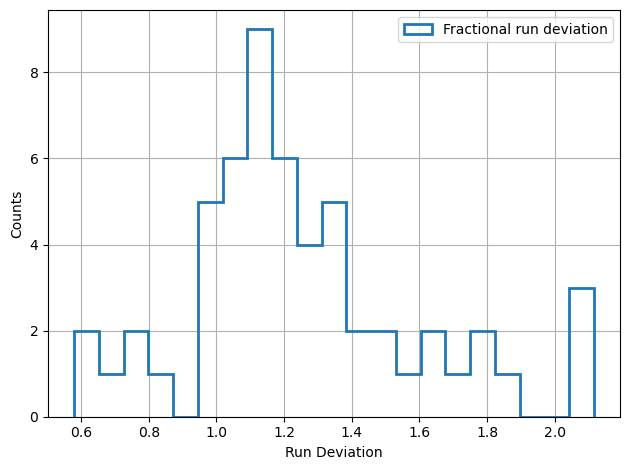

In [56]:
fig, ax = plt.subplots()
plt.hist(deviation, bins=21, label = f'Fractional run deviation', histtype='step', lw=2)
plt.xlabel('Run Deviation')
plt.ylabel('Counts')
plt.legend()
plt.grid()
plt.tight_layout()

# muf.save_figures(PlotDir, name='monogem_fractional_run_deviation_histogram')

plt.show()

In [57]:
indices = np.where(np.isin(ds_on.obs_table['OBS_ID'], on_runs))
zenith_angles = ds_on.obs_table['ZEN_PNT'][indices]
livetime = ds_on.obs_table['LIVETIME'][indices] / 3600
livetime_min = ds_on.obs_table['LIVETIME'][indices] / 60

mean_zenith_angle = np.mean(zenith_angles)
std_zenith_angle =  np.std(zenith_angles)
total_livetime = np.sum(livetime)
run_num = len(obs_list_on)
mean_livetime = np.mean(livetime) 
std_livetime = np.std(livetime)

indices_off = np.where(np.isin(ds_off.obs_table['OBS_ID'], off_runs))
zenith_angles_off = ds_off.obs_table['ZEN_PNT'][indices_off]
livetime_off = ds_off.obs_table['LIVETIME'][indices_off] / 3600
livetime_min_off = ds_off.obs_table['LIVETIME'][indices_off] / 60

mean_zenith_angle_off = np.mean(zenith_angles_off)
std_zenith_angle_off =  np.std(zenith_angles_off)
total_livetime_off = np.sum(livetime_off)
mean_livetime_off = np.mean(livetime_off) 
std_livetime_off = np.std(livetime_off)
run_num_off = len(obs_list_off)

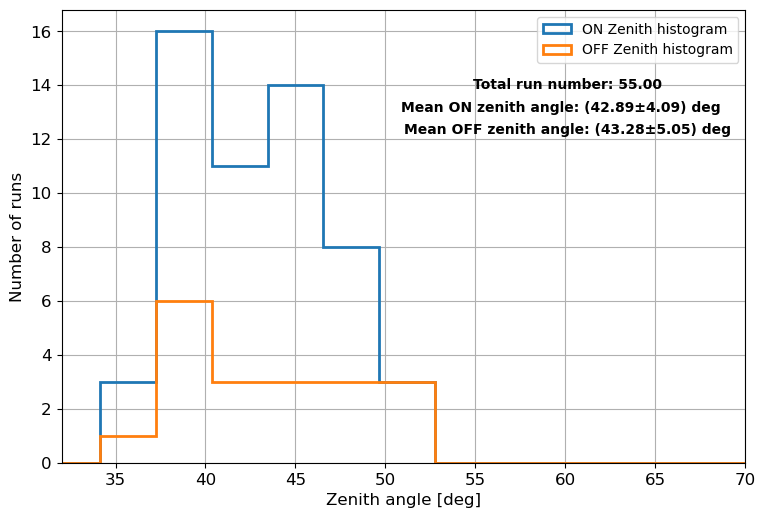

In [80]:
plt.figure(figsize=(30, 20))
gs = GridSpec(3, 3)  

ax1 = plt.subplot(gs[0, 0])

ax1.hist(zenith_angles, bins=np.linspace(0, 90, 30), histtype='step', lw=2, label = 'ON Zenith histogram')

ax1.text(.74, 0.85, f'Total run number: {run_num:.2f}', ha='center', va='top', transform=ax1.transAxes,
        fontsize=10, color='black', fontweight='bold')
ax1.text(.73, 0.8, f'Mean ON zenith angle: ({mean_zenith_angle:.2f}±{std_zenith_angle:.2f}) deg', ha='center', va='top', transform=ax1.transAxes,
        fontsize=10, color='black', fontweight='bold')


ax1.hist(zenith_angles_off, bins=np.linspace(0, 90, 30), histtype='step', lw=2, label = 'OFF Zenith histogram')

ax1.text(.74, 0.75, f'Mean OFF zenith angle: ({mean_zenith_angle_off:.2f}±{std_zenith_angle_off:.2f}) deg', ha='center', va='top', transform=ax1.transAxes,
        fontsize=10, color='black', fontweight='bold')

ax1.grid()
ax1.set_xlim(32, 70)
ax1.legend()

ax1.tick_params(axis='both', which='major', labelsize=12)  # Increase the tick size for major ticks
ax1.tick_params(axis='both', which='minor', labelsize=12)  # Optionally adjust for minor ticks

ax1.set_xlabel('Zenith angle [deg]', fontsize=12)  # Increase x-axis label size
ax1.set_ylabel('Number of runs', fontsize=12)     # Increase y-axis label size

muf.save_figures(PlotDir, name = 'rma_zenith_histogram')

plt.show()

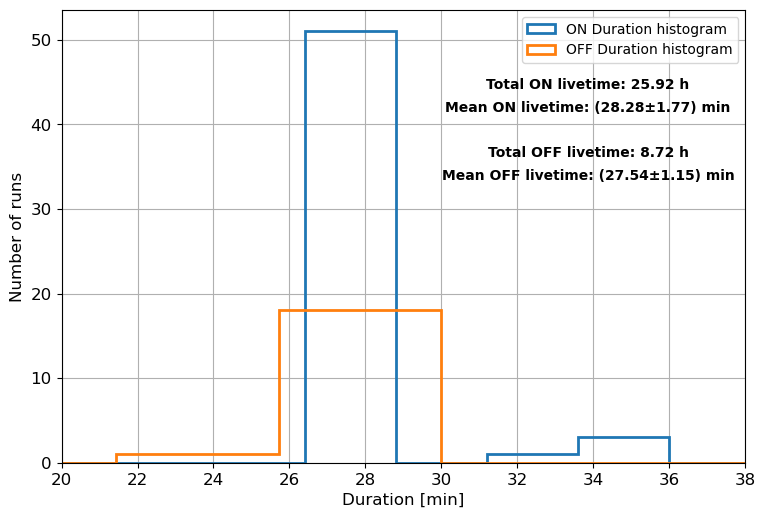

In [79]:
plt.figure(figsize=(30, 20))
gs = GridSpec(3, 3)  

ax1 = plt.subplot(gs[0, 0])
ax1.hist(livetime_min, bins=np.linspace(0, 60, 26), histtype='step', lw=2, label = 'ON Duration histogram')
ax1.text(.77, 0.85, f'Total ON livetime: {total_livetime:.2f} h', ha='center', va='top', transform=ax1.transAxes, fontsize=10, color='black', fontweight='bold')
ax1.text(.77, 0.8, f'Mean ON livetime: ({mean_livetime*60:.2f}±{std_livetime*60:.2f}) min', ha='center', va='top', transform=ax1.transAxes, fontsize=10, color='black', fontweight='bold')

ax1.hist(livetime_min_off, bins=np.linspace(0, 60, 15), histtype='step', lw=2, label = 'OFF Duration histogram')
ax1.text(.77, 0.7, f'Total OFF livetime: {total_livetime_off:.2f} h', ha='center', va='top', transform=ax1.transAxes, fontsize=10, color='black', fontweight='bold')
ax1.text(.77, 0.65, f'Mean OFF livetime: ({mean_livetime_off*60:.2f}±{std_livetime_off*60:.2f}) min', ha='center', va='top', transform=ax1.transAxes, fontsize=10, color='black', fontweight='bold')

ax1.set_xlabel('Duration [min]', fontsize=12)
ax1.set_ylabel('Number of runs', fontsize=12)
ax1.grid()
ax1.set_xlim(20, 38)
ax1.legend()

ax1.tick_params(axis='both', which='major', labelsize=12)  # Increase the tick size for major ticks
ax1.tick_params(axis='both', which='minor', labelsize=12)  # Optionally adjust for minor ticks


muf.save_figures(PlotDir, name = 'monogem_rma_livetime_histogram')

plt.show()

In [49]:
ra_obj = 105.12
dec_obj = 14.32
target = SkyCoord(ra_obj, dec_obj, frame='icrs', unit='deg')

e_reco = np.logspace(-1, 2, 25) * u.TeV 
e_true = np.logspace(-1, 2, 50) * u.TeV 

energy_axis = MapAxis.from_edges(e_reco, unit='TeV', name='energy', interp='log')
energy_axis_true = MapAxis.from_edges(e_true, unit='TeV', name="energy_true", interp='log')

FoV_width = (8, 8)
geom = WcsGeom.create(
    skydir=(ra_obj, dec_obj),
    binsz=0.01,
    width=FoV_width,
    frame="icrs",
    proj="CAR",
    axes=[energy_axis])

In [50]:
maker = MapDatasetMaker()
maker_safe_mask2 = SafeMaskMaker(methods=['offset-max',
                                          'aeff-default',
                                          'aeff-max',
                                          'edisp-bias',
                                          'bkg-peak'
                                         ],
                                 offset_max=offset_max,
                                 # bias_percent=15,
                                )

In [51]:
stacked_name = f'Monogem_stacked_Dataset'
stacked = MapDataset.create(geom=geom, name=stacked_name, energy_axis_true=energy_axis_true)

tilt_list = []
norm_list = []

dict_spec = {'On_run': [], 'Off_run': [],
             'Counts_spec_off_before_bkg_fit': [], 'Bkg_spec_off_before_bkg_fit': [], 'Npred_bkg_spec_off_before_bkg_fit': [],
             'Counts_spec_off_after_bkg_fit': [], 'Bkg_spec_off_after_bkg_fit': [], 'Npred_bkg_spec_off_after_bkg_fit': [], 
             'Counts_spec_on_before_bkg_fit': [], 'Bkg_spec_on_before_bkg_fit': [], 'Npred_bkg_spec_on_before_bkg_fit': [],
             'Counts_spec_on_after_bkg_fit': [], 'Bkg_spec_on_after_bkg_fit': [], 'Npred_bkg_spec_on_after_bkg_fit': [],   
             'Date_On': [], 'Date_Off': []}

print(f'{len(obs_list_on)} runs to analyse!')

for m in range(len(obs_list_on)):
    print(f'{m+1} of {len(obs_list_on)} runs to analyse')
    obs = obs_list_on[m]
    off_run = obs_list_off[m]
    dev = deviation[m]
    
    obs_id = obs.obs_id
    obs_id_off = off_run.obs_id
    
    date_on = Time(obs.tmid.value, format='mjd')
    calendar_date_on = date_on.to_value('iso', subfmt='date')

    date_off = Time(off_run.tmid.value, format='mjd')
    calendar_date_off = date_off.to_value('iso', subfmt='date')

    
    print(f'On run: {obs.obs_id}, Date: {calendar_date_on}')
    print(f'Off run: {off_run.obs_id}, Date: {calendar_date_off}')    
    
    
    print(f'On run dead time fraction: {round(obs.observation_dead_time_fraction * 100,2)} %')
    print(f'Off run dead time fraction: {round(off_run.observation_dead_time_fraction * 100,2)} %')
    
    # ON run dataset geometry 
    cutout = stacked.cutout(obs.pointing.fixed_icrs, width=2*offset_max, name=f"obs-{obs.obs_id}")
    dataset = maker.run(cutout, obs)
    dataset = maker_safe_mask2.run(dataset, obs)  
    
    #print(dataset)
    
    number_on = find_energy_threshold(dataset)
    
    # OFF run dataset geometry:
    geom_off = WcsGeom.create(skydir=off_run.pointing.fixed_icrs, binsz=0.02, width=FoV_width, frame="icrs", proj="CAR", axes=[energy_axis])
    
    stacked_off = MapDataset.create(geom=geom_off, name=f"obs-{off_run.obs_id}", energy_axis_true= energy_axis_true)
    cutout_off = stacked_off.cutout(off_run.pointing.fixed_icrs, width=2*offset_max, name=f"obs-{off_run.obs_id}")
    
    #define exclusion region and safe mask for the background fit
    maker_fov_off, ex = get_exclusion_mask(off_run, geom_off, 10, radius_source_mask=.3)
    
    #fit the background to the OFF run
    dataset_off = maker.run(cutout_off, off_run)
    dataset_off = maker_safe_mask2.run(dataset_off, off_run)
    
    number_off = find_energy_threshold(dataset_off)
    
    #find the highest energy threshold between ON and OFF run
    number = max(number_on, number_off)
    
    # apply the energy threshold to both ON and OFF run
    dataset.background = adjust_energy_threshold(dataset.background, number)
    dataset.counts = adjust_energy_threshold(dataset.counts, number)
    dataset_off.background = adjust_energy_threshold(dataset_off.background, number)
    dataset_off.counts = adjust_energy_threshold(dataset_off.counts, number)

    #print(dataset)

    counts_spec_off_before_bkg_fit = dataset_off.counts.get_spectrum().data[:,0][:,0].tolist() # Counts
    back_spec_off_before_bkg_fit = dataset_off.background.get_spectrum().data[:,0][:,0].tolist() # IRF background 
    npred_back_spec_off_before_bkg_fit = dataset_off.npred_background().get_spectrum().data[:,0][:,0].tolist() # Predicted background

    counts_spec_on_before_bkg_fit = dataset.counts.get_spectrum().data[:,0][:,0].tolist() # Counts
    back_spec_on_before_bkg_fit = dataset.background.get_spectrum().data[:,0][:,0].tolist() # IRF background 
    npred_back_spec_on_before_bkg_fit = dataset.npred_background().get_spectrum().data[:,0][:,0].tolist() # Predicted background
    
    #The background fit
    bkg_model_off = FoVBackgroundModel(dataset_name=dataset_off.name)
    dataset_off.models = bkg_model_off
    dataset_off.background_model.spectral_model.tilt.frozen = False
    dataset_off = maker_fov_off.run(dataset_off)
    
    bkg_model_on = FoVBackgroundModel(dataset_name=dataset.name)
    dataset.models = bkg_model_on
    
    dataset.background_model.spectral_model.norm.value = dataset_off.background_model.spectral_model.norm.value
    dataset.background_model.spectral_model.tilt.value = dataset_off.background_model.spectral_model.tilt.value
    
    dataset.background_model.spectral_model.norm.frozen = True
    dataset.background_model.spectral_model.tilt.frozen = True
    dataset.background_model.spectral_model.reference.frozen = True
    
    tilt_list.append(dataset.background_model.spectral_model.tilt.value)
    norm_list.append(dataset.background_model.spectral_model.norm.value)
    
    # Apply the corrections
    dataset = livetime_corr(obs, off_run, dataset)
    dataset = zenith_corr(obs, off_run, dataset)

    print(f'R.A.: {round(obs.pointing.fixed_icrs.ra.value,2)} deg, Dec: {round(obs.pointing.fixed_icrs.dec.value,2)} deg')
    print(f'On run {obs_id}, Off run {obs_id_off}')
    print(f'Norm: {round(dataset.background_model.spectral_model.norm.value, 3)}, Tilt: {round(dataset.background_model.spectral_model.tilt.value, 3)}')
    print('\n')

    counts_spec_off_after_bkg_fit = dataset_off.counts.get_spectrum().data[:,0][:,0].tolist() # Counts
    back_spec_off_after_bkg_fit = dataset_off.background.get_spectrum().data[:,0][:,0].tolist() # IRF background 
    npred_back_spec_off_after_bkg_fit = dataset_off.npred_background().get_spectrum().data[:,0][:,0].tolist() # Predicted background

    counts_spec_on_after_bkg_fit = dataset.counts.get_spectrum().data[:,0][:,0].tolist() # Counts
    back_spec_on_after_bkg_fit = dataset.background.get_spectrum().data[:,0][:,0].tolist() # IRF background 
    npred_back_spec_on_after_bkg_fit = dataset.npred_background().get_spectrum().data[:,0][:,0].tolist() # Predicted background
    
    dict_spec['On_run'].append(obs_id)
    dict_spec['Off_run'].append(obs_id_off)
    
    dict_spec['Counts_spec_off_before_bkg_fit'].append(counts_spec_off_before_bkg_fit)
    dict_spec['Bkg_spec_off_before_bkg_fit'].append(back_spec_off_before_bkg_fit)
    dict_spec['Npred_bkg_spec_off_before_bkg_fit'].append(npred_back_spec_off_before_bkg_fit)

    dict_spec['Counts_spec_off_after_bkg_fit'].append(counts_spec_off_after_bkg_fit)
    dict_spec['Bkg_spec_off_after_bkg_fit'].append(back_spec_off_after_bkg_fit)
    dict_spec['Npred_bkg_spec_off_after_bkg_fit'].append(npred_back_spec_off_after_bkg_fit) 

    dict_spec['Counts_spec_on_before_bkg_fit'].append(counts_spec_on_before_bkg_fit)
    dict_spec['Bkg_spec_on_before_bkg_fit'].append(back_spec_on_before_bkg_fit)
    dict_spec['Npred_bkg_spec_on_before_bkg_fit'].append(npred_back_spec_on_before_bkg_fit)

    dict_spec['Counts_spec_on_after_bkg_fit'].append(counts_spec_on_after_bkg_fit)
    dict_spec['Bkg_spec_on_after_bkg_fit'].append(back_spec_on_after_bkg_fit)
    dict_spec['Npred_bkg_spec_on_after_bkg_fit'].append(npred_back_spec_on_after_bkg_fit) 
    
    dict_spec['Date_On'].append(calendar_date_on)
    dict_spec['Date_Off'].append(calendar_date_off)
      
    stacked.stack(dataset)

55 runs to analyse!
1 of 55 runs to analyse
On run: 165811, Date: 2021-04-08
Off run: 176277, Date: 2022-07-03
On run dead time fraction: 0.66 %
Off run dead time fraction: 2.26 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165811, Off run 176277
Norm: 1.07, Tilt: 0.043


2 of 55 runs to analyse
On run: 165839, Date: 2021-04-09
Off run: 170775, Date: 2021-10-28
On run dead time fraction: 0.79 %
Off run dead time fraction: 0.6 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165839, Off run 170775
Norm: 1.099, Tilt: -0.122


3 of 55 runs to analyse
On run: 165936, Date: 2021-04-12
Off run: 176277, Date: 2022-07-03
On run dead time fraction: 0.64 %
Off run dead time fraction: 2.26 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165936, Off run 176277
Norm: 1.07, Tilt: 0.043


4 of 55 runs to analyse
On run: 165933, Date: 2021-04-12
Off run: 170775, Date: 2021-10-28
On run dead time fraction: 0.72 %
Off run dead time fraction: 0.6 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165933, Off run 170775
Norm: 1.099, Tilt: -0.122


5 of 55 runs to analyse
On run: 165842, Date: 2021-04-09
Off run: 176277, Date: 2022-07-03
On run dead time fraction: 0.71 %
Off run dead time fraction: 2.26 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165842, Off run 176277
Norm: 1.07, Tilt: 0.043


6 of 55 runs to analyse
On run: 165310, Date: 2021-03-12
Off run: 176277, Date: 2022-07-03
On run dead time fraction: 0.82 %
Off run dead time fraction: 2.26 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165310, Off run 176277
Norm: 1.07, Tilt: 0.043


7 of 55 runs to analyse
On run: 165810, Date: 2021-04-08
Off run: 176277, Date: 2022-07-03
On run dead time fraction: 0.71 %
Off run dead time fraction: 2.26 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165810, Off run 176277
Norm: 1.07, Tilt: 0.043


8 of 55 runs to analyse
On run: 165302, Date: 2021-03-12
Off run: 183894, Date: 2023-07-21
On run dead time fraction: 0.96 %
Off run dead time fraction: 0.6 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165302, Off run 183894
Norm: 1.473, Tilt: 0.064


9 of 55 runs to analyse
On run: 165244, Date: 2021-03-10
Off run: 167302, Date: 2021-06-11
On run dead time fraction: 0.73 %
Off run dead time fraction: 0.59 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165244, Off run 167302
Norm: 1.199, Tilt: -0.034


10 of 55 runs to analyse
On run: 165306, Date: 2021-03-12
Off run: 170316, Date: 2021-10-08
On run dead time fraction: 0.89 %
Off run dead time fraction: 0.77 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165306, Off run 170316
Norm: 1.065, Tilt: -0.032


11 of 55 runs to analyse
On run: 165807, Date: 2021-04-08
Off run: 167749, Date: 2021-06-29
On run dead time fraction: 0.82 %
Off run dead time fraction: 0.65 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165807, Off run 167749
Norm: 1.118, Tilt: -0.103


12 of 55 runs to analyse
On run: 165278, Date: 2021-03-11
Off run: 176277, Date: 2022-07-03
On run dead time fraction: 0.69 %
Off run dead time fraction: 2.26 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165278, Off run 176277
Norm: 1.07, Tilt: 0.043


13 of 55 runs to analyse
On run: 165305, Date: 2021-03-12
Off run: 167747, Date: 2021-06-29
On run dead time fraction: 0.95 %
Off run dead time fraction: 0.78 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165305, Off run 167747
Norm: 1.051, Tilt: -0.045


14 of 55 runs to analyse
On run: 165966, Date: 2021-04-13
Off run: 176277, Date: 2022-07-03
On run dead time fraction: 0.76 %
Off run dead time fraction: 2.26 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165966, Off run 176277
Norm: 1.07, Tilt: 0.043


15 of 55 runs to analyse
On run: 165308, Date: 2021-03-12
Off run: 170123, Date: 2021-10-01
On run dead time fraction: 0.79 %
Off run dead time fraction: 0.67 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165308, Off run 170123
Norm: 1.063, Tilt: -0.052


16 of 55 runs to analyse
On run: 165205, Date: 2021-03-09
Off run: 170879, Date: 2021-10-31
On run dead time fraction: 0.69 %
Off run dead time fraction: 0.61 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165205, Off run 170879
Norm: 1.065, Tilt: -0.101


17 of 55 runs to analyse
On run: 165429, Date: 2021-03-17
Off run: 170123, Date: 2021-10-01
On run dead time fraction: 0.75 %
Off run dead time fraction: 0.67 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165429, Off run 170123
Norm: 1.063, Tilt: -0.052


18 of 55 runs to analyse
On run: 165400, Date: 2021-03-16
Off run: 170123, Date: 2021-10-01
On run dead time fraction: 0.81 %
Off run dead time fraction: 0.67 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165400, Off run 170123
Norm: 1.063, Tilt: -0.052


19 of 55 runs to analyse
On run: 165750, Date: 2021-04-06
Off run: 173732, Date: 2022-04-05
On run dead time fraction: 0.85 %
Off run dead time fraction: 0.58 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165750, Off run 173732
Norm: 1.025, Tilt: -0.084


20 of 55 runs to analyse
On run: 165276, Date: 2021-03-11
Off run: 170123, Date: 2021-10-01
On run dead time fraction: 0.79 %
Off run dead time fraction: 0.67 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165276, Off run 170123
Norm: 1.063, Tilt: -0.052


21 of 55 runs to analyse
On run: 165963, Date: 2021-04-13
Off run: 170123, Date: 2021-10-01
On run dead time fraction: 0.85 %
Off run dead time fraction: 0.67 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165963, Off run 170123
Norm: 1.063, Tilt: -0.052


22 of 55 runs to analyse
On run: 165398, Date: 2021-03-16
Off run: 169641, Date: 2021-09-08
On run dead time fraction: 0.89 %
Off run dead time fraction: 0.77 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165398, Off run 169641
Norm: 1.031, Tilt: -0.065


23 of 55 runs to analyse
On run: 165274, Date: 2021-03-11
Off run: 169641, Date: 2021-09-08
On run dead time fraction: 0.88 %
Off run dead time fraction: 0.77 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165274, Off run 169641
Norm: 1.031, Tilt: -0.065


24 of 55 runs to analyse
On run: 165395, Date: 2021-03-16
Off run: 167747, Date: 2021-06-29
On run dead time fraction: 0.91 %
Off run dead time fraction: 0.78 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165395, Off run 167747
Norm: 1.051, Tilt: -0.045


25 of 55 runs to analyse
On run: 165427, Date: 2021-03-17
Off run: 171552, Date: 2021-12-01
On run dead time fraction: 0.83 %
Off run dead time fraction: 0.69 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165427, Off run 171552
Norm: 0.99, Tilt: 0.075


26 of 55 runs to analyse
On run: 165242, Date: 2021-03-10
Off run: 171553, Date: 2021-12-01
On run dead time fraction: 0.82 %
Off run dead time fraction: 0.67 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165242, Off run 171553
Norm: 1.023, Tilt: 0.019


27 of 55 runs to analyse
On run: 165425, Date: 2021-03-17
Off run: 167747, Date: 2021-06-29
On run dead time fraction: 0.96 %
Off run dead time fraction: 0.78 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165425, Off run 167747
Norm: 1.037, Tilt: -0.062


28 of 55 runs to analyse
On run: 165170, Date: 2021-03-08
Off run: 171552, Date: 2021-12-01
On run dead time fraction: 0.84 %
Off run dead time fraction: 0.69 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165170, Off run 171552
Norm: 0.99, Tilt: 0.075


29 of 55 runs to analyse
On run: 165168, Date: 2021-03-08
Off run: 169641, Date: 2021-09-08
On run dead time fraction: 0.91 %
Off run dead time fraction: 0.77 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165168, Off run 169641
Norm: 1.031, Tilt: -0.065


30 of 55 runs to analyse
On run: 165203, Date: 2021-03-09
Off run: 171552, Date: 2021-12-01
On run dead time fraction: 0.82 %
Off run dead time fraction: 0.69 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165203, Off run 171552
Norm: 0.99, Tilt: 0.075


31 of 55 runs to analyse
On run: 165394, Date: 2021-03-16
Off run: 167747, Date: 2021-06-29
On run dead time fraction: 0.99 %
Off run dead time fraction: 0.78 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165394, Off run 167747
Norm: 1.037, Tilt: -0.062


32 of 55 runs to analyse
On run: 165268, Date: 2021-03-11
Off run: 174650, Date: 2022-05-05
On run dead time fraction: 0.97 %
Off run dead time fraction: 1.0 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165268, Off run 174650
Norm: 1.049, Tilt: -0.072


33 of 55 runs to analyse
On run: 165272, Date: 2021-03-11
Off run: 167747, Date: 2021-06-29
On run dead time fraction: 0.93 %
Off run dead time fraction: 0.78 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165272, Off run 167747
Norm: 1.037, Tilt: -0.062


34 of 55 runs to analyse
On run: 165166, Date: 2021-03-08
Off run: 167747, Date: 2021-06-29
On run dead time fraction: 0.93 %
Off run dead time fraction: 0.78 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165166, Off run 167747
Norm: 1.037, Tilt: -0.062


35 of 55 runs to analyse
On run: 165201, Date: 2021-03-09
Off run: 171552, Date: 2021-12-01
On run dead time fraction: 0.74 %
Off run dead time fraction: 0.69 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165201, Off run 171552
Norm: 0.99, Tilt: 0.075


36 of 55 runs to analyse
On run: 165749, Date: 2021-04-06
Off run: 171552, Date: 2021-12-01
On run dead time fraction: 0.97 %
Off run dead time fraction: 0.69 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165749, Off run 171552
Norm: 0.99, Tilt: 0.075


37 of 55 runs to analyse
On run: 165199, Date: 2021-03-09
Off run: 173961, Date: 2022-04-12
On run dead time fraction: 0.83 %
Off run dead time fraction: 0.79 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165199, Off run 173961
Norm: 1.033, Tilt: -0.041


38 of 55 runs to analyse
On run: 165164, Date: 2021-03-08
Off run: 167747, Date: 2021-06-29
On run dead time fraction: 0.96 %
Off run dead time fraction: 0.78 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165164, Off run 167747
Norm: 1.037, Tilt: -0.062


39 of 55 runs to analyse
On run: 165423, Date: 2021-03-17
Off run: 173825, Date: 2022-04-08
On run dead time fraction: 1.06 %
Off run dead time fraction: 0.81 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 165423, Off run 173825
Norm: 1.071, Tilt: -0.001


40 of 55 runs to analyse
On run: 165240, Date: 2021-03-10
Off run: 171552, Date: 2021-12-01
On run dead time fraction: 0.87 %
Off run dead time fraction: 0.69 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165240, Off run 171552
Norm: 0.99, Tilt: 0.075


41 of 55 runs to analyse
On run: 165271, Date: 2021-03-11
Off run: 173825, Date: 2022-04-08
On run dead time fraction: 0.96 %
Off run dead time fraction: 0.81 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 165271, Off run 173825
Norm: 1.071, Tilt: -0.001


42 of 55 runs to analyse
On run: 165197, Date: 2021-03-09
Off run: 170389, Date: 2021-10-11
On run dead time fraction: 0.98 %
Off run dead time fraction: 0.82 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165197, Off run 170389
Norm: 1.043, Tilt: 0.033


43 of 55 runs to analyse
On run: 165236, Date: 2021-03-10
Off run: 170389, Date: 2021-10-11
On run dead time fraction: 0.96 %
Off run dead time fraction: 0.82 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 165236, Off run 170389
Norm: 1.043, Tilt: 0.033


44 of 55 runs to analyse
On run: 165746, Date: 2021-04-06
Off run: 171552, Date: 2021-12-01
On run dead time fraction: 1.68 %
Off run dead time fraction: 0.69 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 165746, Off run 171552
Norm: 0.99, Tilt: 0.075


45 of 55 runs to analyse
On run: 171611, Date: 2021-12-05
Off run: 171084, Date: 2021-11-08
On run dead time fraction: 0.84 %
Off run dead time fraction: 0.88 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 171611, Off run 171084
Norm: 1.023, Tilt: -0.016


46 of 55 runs to analyse
On run: 171631, Date: 2021-12-06
Off run: 171084, Date: 2021-11-08
On run dead time fraction: 0.85 %
Off run dead time fraction: 0.88 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 171631, Off run 171084
Norm: 1.023, Tilt: -0.016


47 of 55 runs to analyse
On run: 171652, Date: 2021-12-07
Off run: 171084, Date: 2021-11-08
On run dead time fraction: 0.77 %
Off run dead time fraction: 0.88 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 171652, Off run 171084
Norm: 1.023, Tilt: -0.016


48 of 55 runs to analyse
On run: 172093, Date: 2022-01-02
Off run: 171084, Date: 2021-11-08
On run dead time fraction: 0.77 %
Off run dead time fraction: 0.88 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 172093, Off run 171084
Norm: 1.023, Tilt: -0.016


49 of 55 runs to analyse
On run: 172090, Date: 2022-01-01
Off run: 165758, Date: 2021-04-06
On run dead time fraction: 0.91 %
Off run dead time fraction: 1.01 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 172090, Off run 165758
Norm: 1.034, Tilt: 0.006


50 of 55 runs to analyse
On run: 171589, Date: 2021-12-04
Off run: 165758, Date: 2021-04-06
On run dead time fraction: 0.87 %
Off run dead time fraction: 1.01 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 171589, Off run 165758
Norm: 1.013, Tilt: -0.034


51 of 55 runs to analyse
On run: 172067, Date: 2021-12-31
Off run: 165758, Date: 2021-04-06
On run dead time fraction: 0.9 %
Off run dead time fraction: 1.01 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 172067, Off run 165758
Norm: 1.034, Tilt: 0.006


52 of 55 runs to analyse
On run: 172155, Date: 2022-01-04
Off run: 165758, Date: 2021-04-06
On run dead time fraction: 0.84 %
Off run dead time fraction: 1.01 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 15.94 deg
On run 172155, Off run 165758
Norm: 1.034, Tilt: 0.006


53 of 55 runs to analyse
On run: 172200, Date: 2022-01-06
Off run: 165758, Date: 2021-04-06
On run dead time fraction: 0.85 %
Off run dead time fraction: 1.01 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 103.35 deg, Dec: 14.24 deg
On run 172200, Off run 165758
Norm: 1.034, Tilt: 0.006


54 of 55 runs to analyse
On run: 172154, Date: 2022-01-04
Off run: 165758, Date: 2021-04-06
On run dead time fraction: 0.85 %
Off run dead time fraction: 1.01 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 104.95 deg, Dec: 12.54 deg
On run 172154, Off run 165758
Norm: 1.034, Tilt: 0.006


55 of 55 runs to analyse
On run: 172156, Date: 2022-01-04
Off run: 165758, Date: 2021-04-06
On run dead time fraction: 0.86 %
Off run dead time fraction: 1.01 %


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


R.A.: 106.55 deg, Dec: 14.24 deg
On run 172156, Off run 165758
Norm: 1.034, Tilt: 0.006




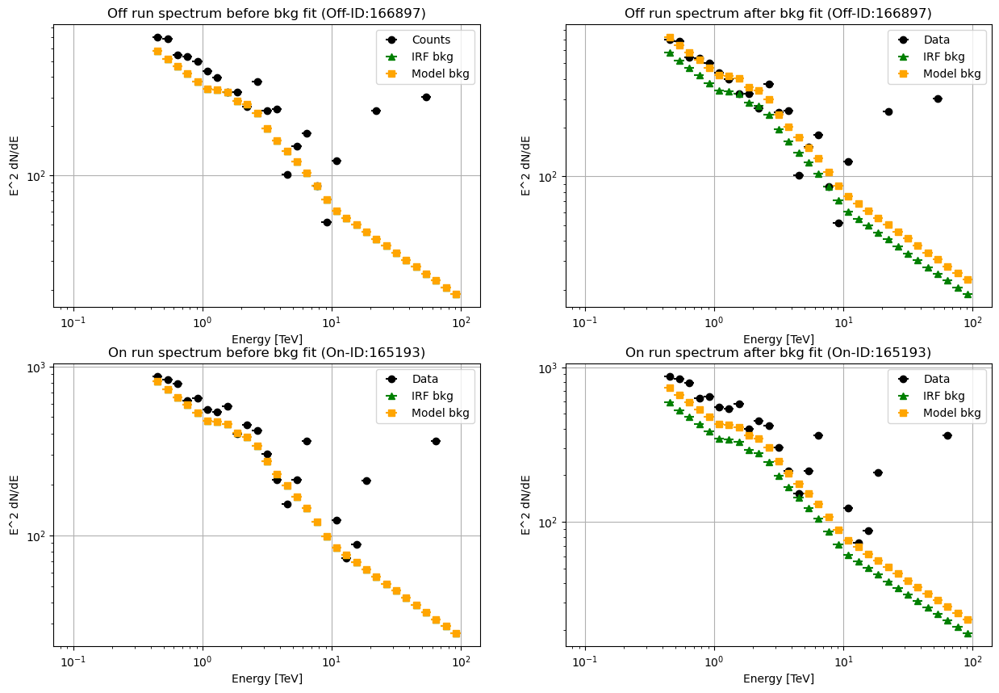

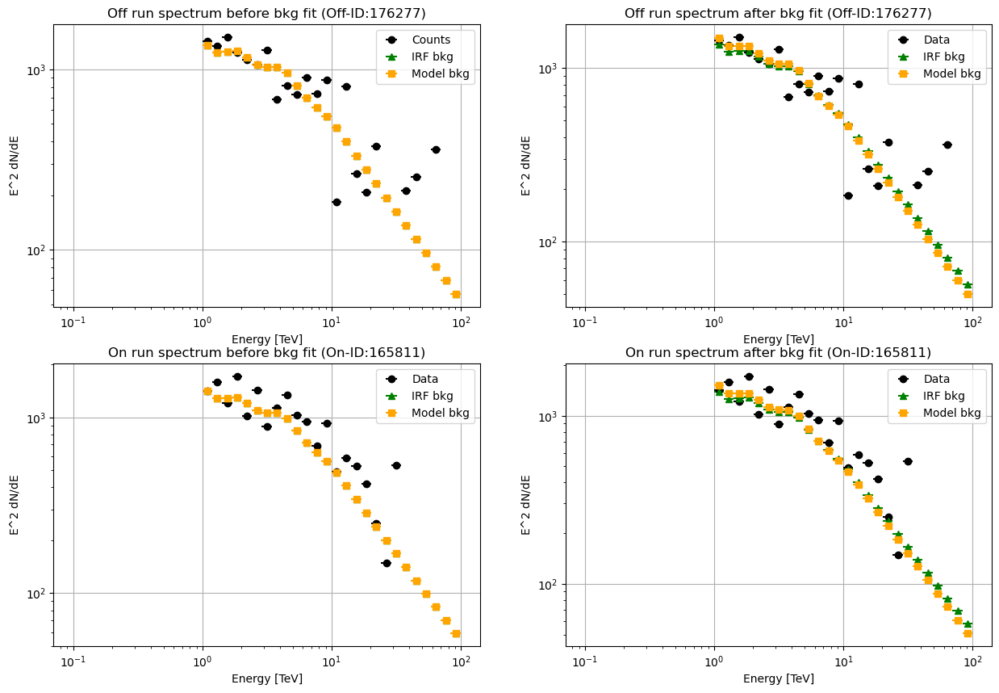

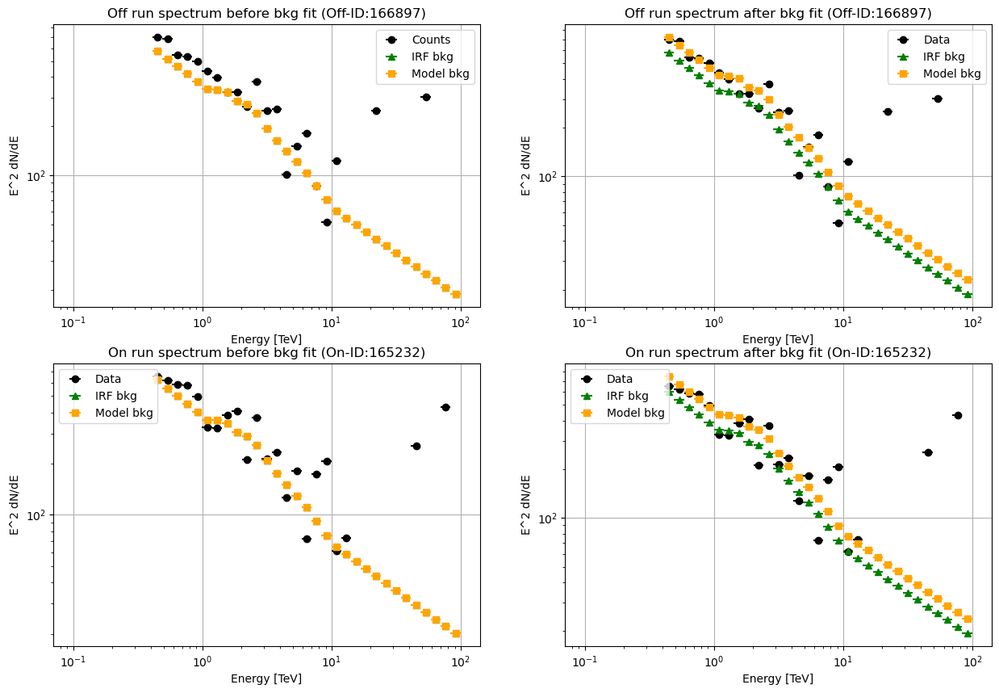

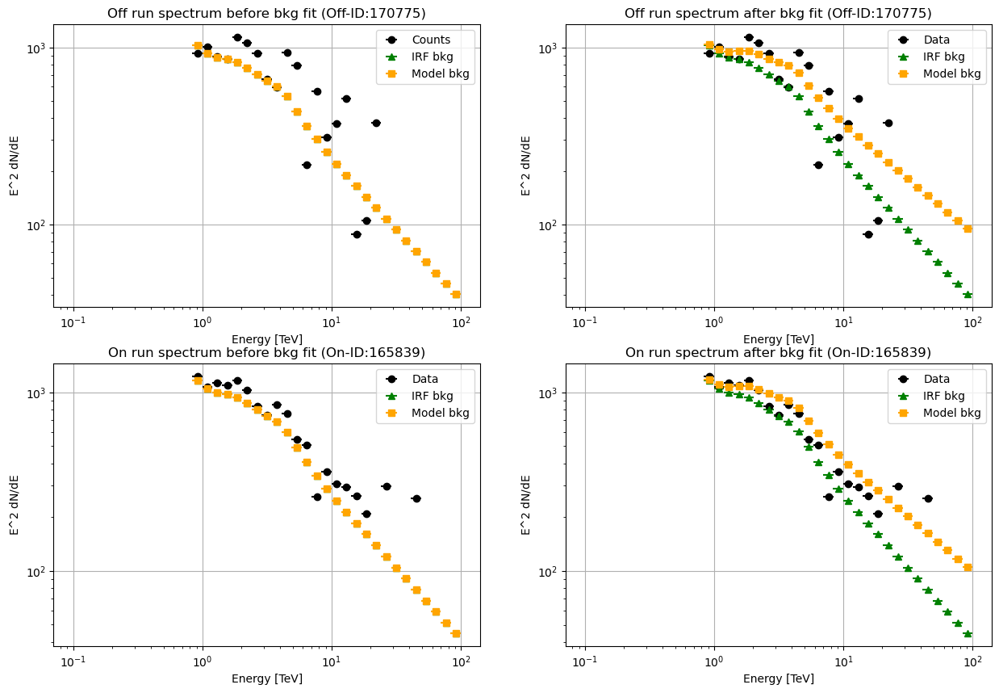

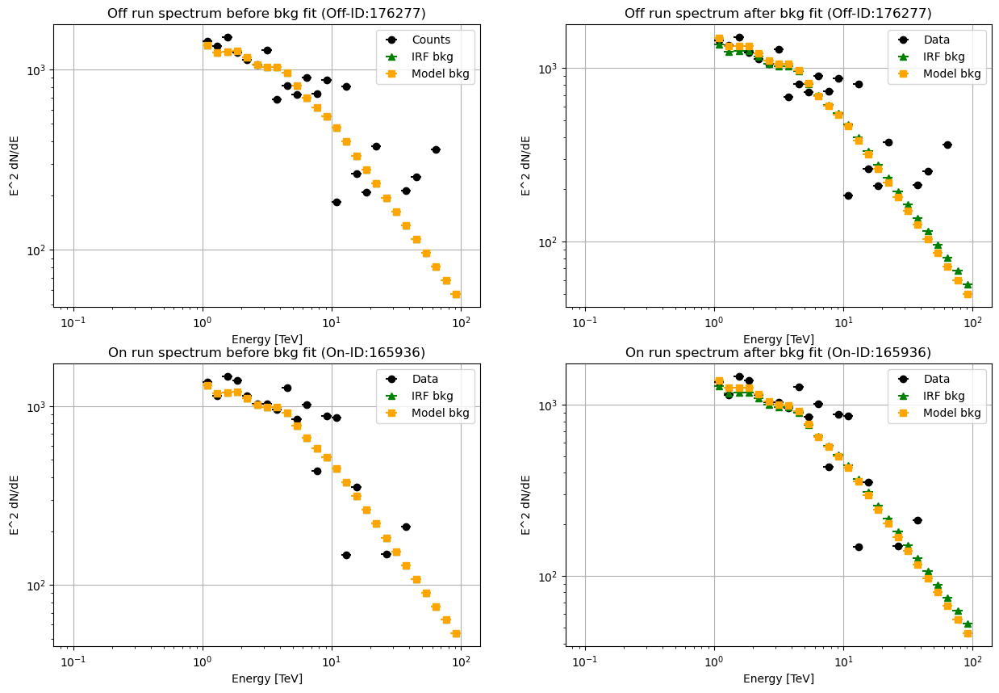

...

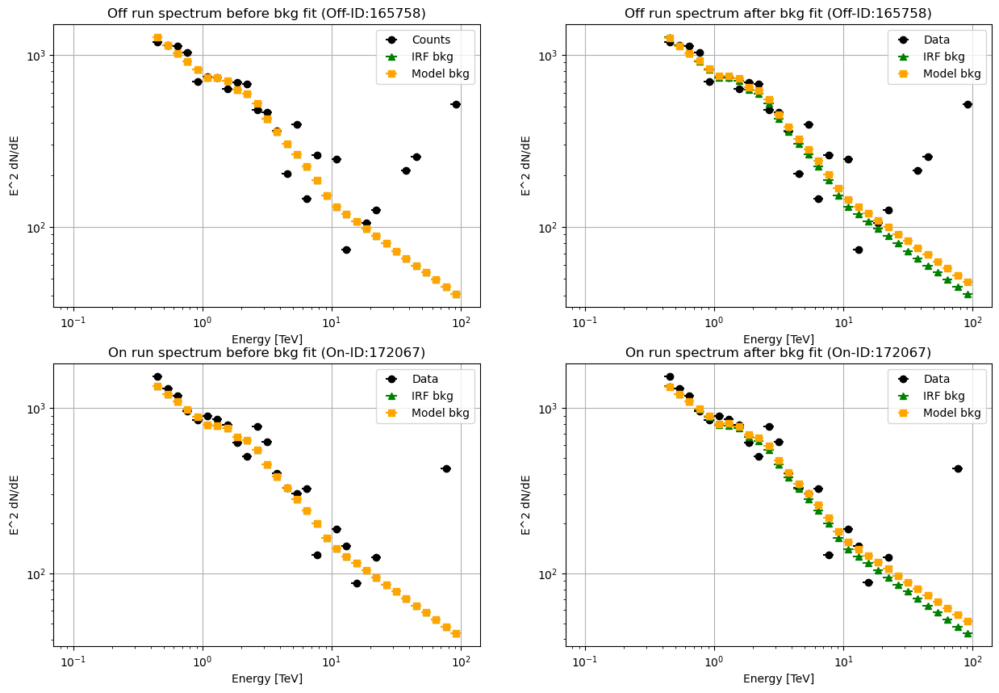

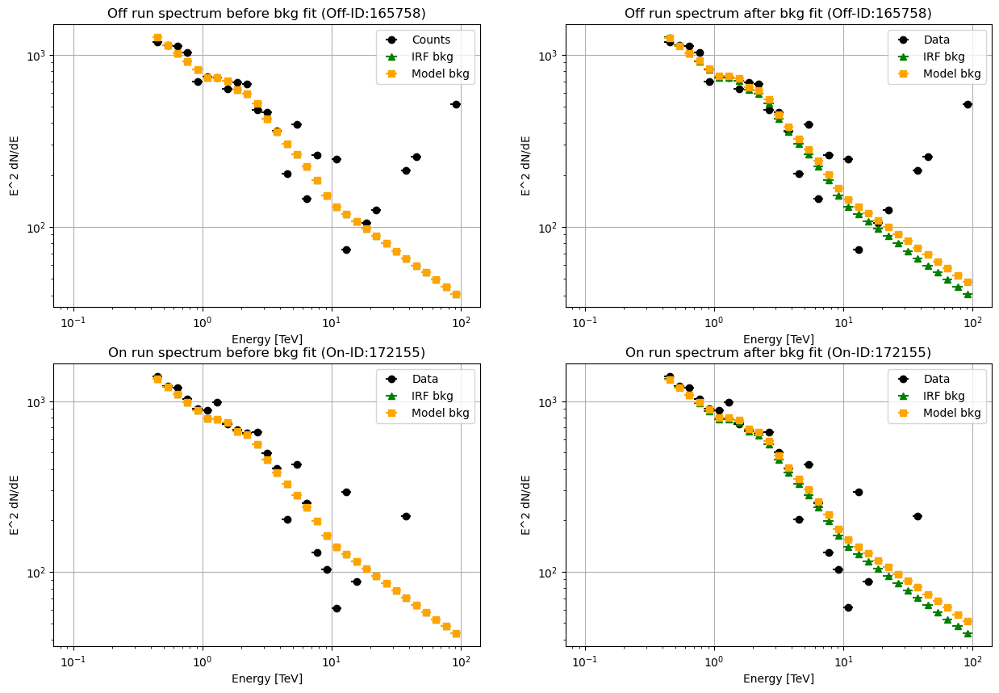

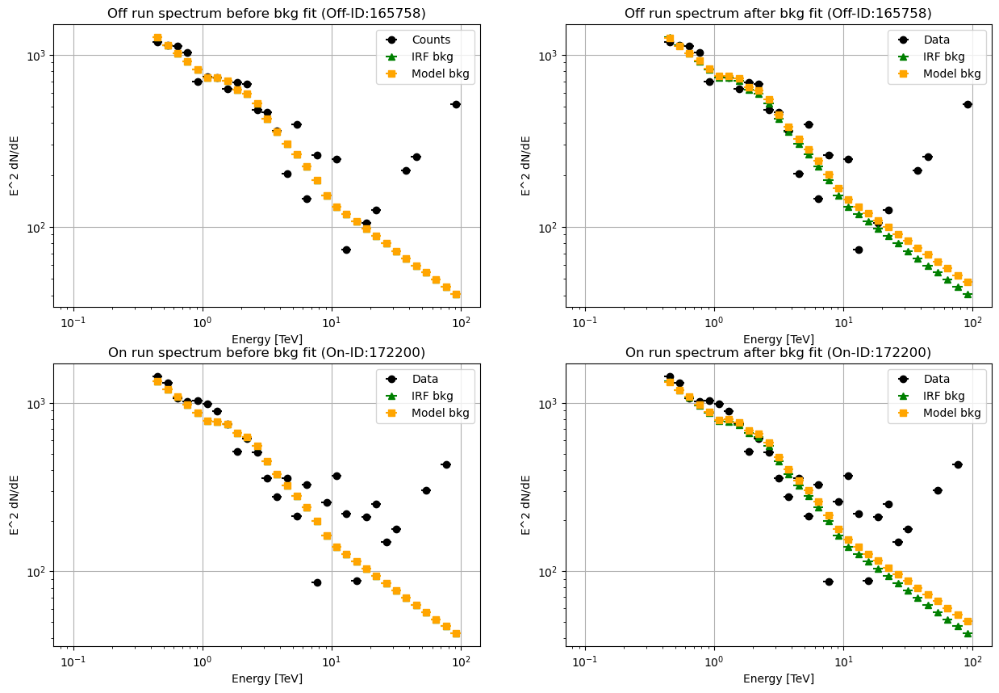

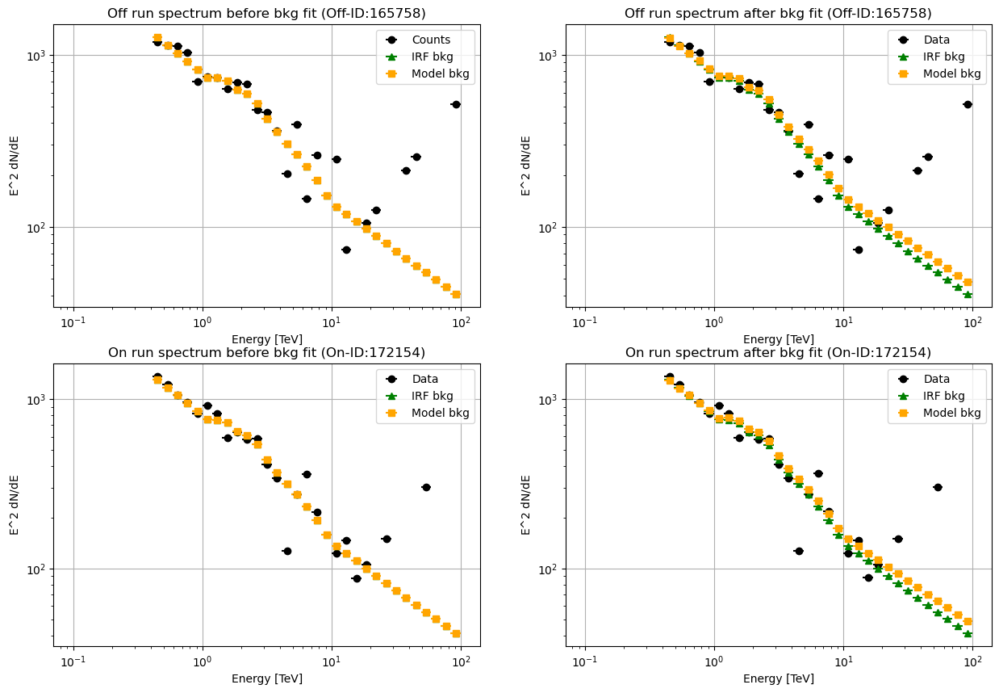

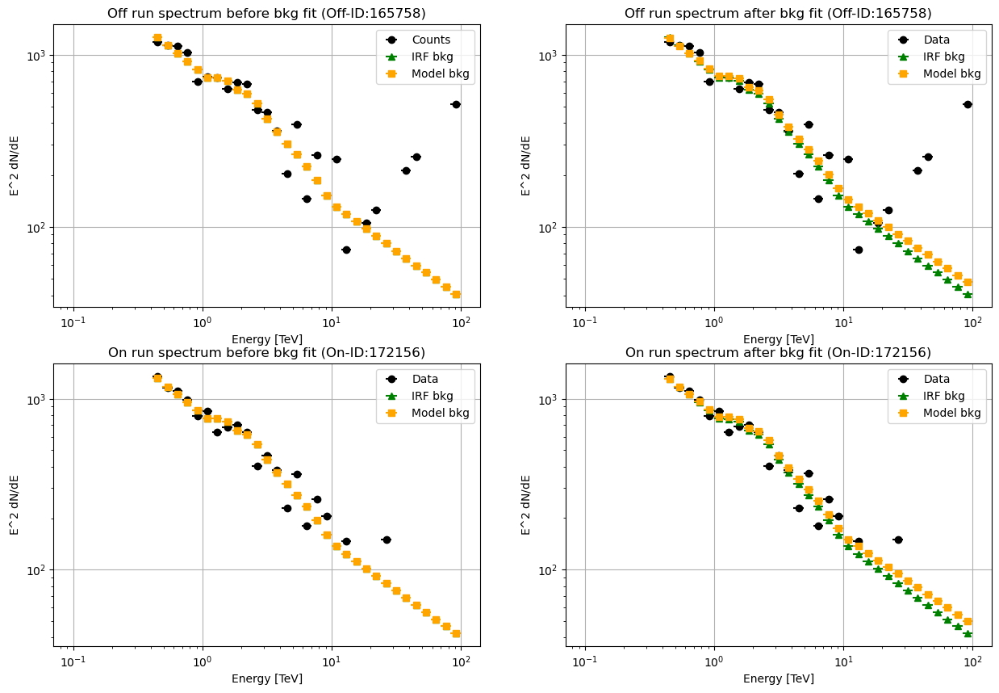

In [72]:
# Sample data
on_id_spec = dict_spec['On_run']
off_id_spec = dict_spec['Off_run']
date_on = dict_spec['Date_On']
date_off = dict_spec['Date_Off']

### Off Counts ###
## Before Background fit ##
counts_spec_off_before_bkg_fit_for_plots = dict_spec['Counts_spec_off_before_bkg_fit'] 
back_spec_off_before_bkg_fit_for_plots = dict_spec['Bkg_spec_off_before_bkg_fit']
npred_back_spec_off_before_bkg_fit_for_plots = dict_spec['Npred_bkg_spec_off_before_bkg_fit']

## After Background fit ##
counts_spec_off_after_bkg_fit_for_plots = dict_spec['Counts_spec_off_after_bkg_fit']
back_spec_off_after_bkg_fit_for_plots = dict_spec['Bkg_spec_off_after_bkg_fit']
npred_back_spec_off_after_bkg_fit_for_plots = dict_spec['Npred_bkg_spec_off_after_bkg_fit']


### On Counts ###
## Before Background fit ##
counts_spec_on_before_bkg_fit_for_plots = dict_spec['Counts_spec_on_before_bkg_fit']
back_spec_on_before_bkg_fit_for_plots = dict_spec['Bkg_spec_on_before_bkg_fit']
npred_back_spec_on_before_bkg_fit_for_plots = dict_spec['Npred_bkg_spec_on_before_bkg_fit']

## After Background fit ##
counts_spec_on_after_bkg_fit_for_plots = dict_spec['Counts_spec_on_after_bkg_fit']
back_spec_on_after_bkg_fit_for_plots = dict_spec['Bkg_spec_on_after_bkg_fit']
npred_back_spec_on_after_bkg_fit_for_plots = dict_spec['Npred_bkg_spec_on_after_bkg_fit']


# Energy bin centers and edges
energy_bin_centers = energy_axis.center
energy_bin_edges = energy_axis.edges

# Calculate the bin widths (difference between consecutive edges)
bin_widths = np.diff(energy_bin_edges)
bin_half_widths = bin_widths / 2  # Half of the bin width for error bars

# Check the number of on-off observations (assuming it's 7 here)
num_pairs = len(on_id_spec)

def scaled_counts(_counts_to_scale_, _energy_bin_centers_, _bin_widths_):
    return ((_counts_to_scale_ * _energy_bin_centers_**2 / _bin_widths_))

# Create individual plots for each on-off observation
for i in range(num_pairs):
    plt.figure(figsize=(15, 10))
    gs = GridSpec(2, 2, height_ratios=[1, 1])  

    
    # Apply E^2 and bin width scaling for each pair
    counts_spec_off_before_bkg_fit_scaled = scaled_counts(counts_spec_off_before_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    back_spec_off_before_bkg_fit_scaled = scaled_counts(back_spec_off_before_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    npred_back_spec_off_before_bkg_fit_scaled = scaled_counts(npred_back_spec_off_before_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    
    counts_spec_off_after_bkg_fit_scaled = scaled_counts(counts_spec_off_after_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    back_spec_off_after_bkg_fit_scaled = scaled_counts(back_spec_off_after_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    npred_back_spec_off_after_bkg_fit_scaled = scaled_counts(npred_back_spec_off_after_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    
    counts_spec_on_before_bkg_fit_scaled = scaled_counts(counts_spec_on_before_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    back_spec_on_before_bkg_fit_scaled = scaled_counts(back_spec_on_before_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    npred_back_spec_on_before_bkg_fit_scaled = scaled_counts(npred_back_spec_on_before_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    
    counts_spec_on_after_bkg_fit_scaled = scaled_counts(counts_spec_on_after_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    back_spec_on_after_bkg_fit_scaled = scaled_counts(back_spec_on_after_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)
    npred_back_spec_on_after_bkg_fit_scaled = scaled_counts(npred_back_spec_on_after_bkg_fit_for_plots[i], energy_bin_centers, bin_widths)


    # Plot the scaled counts, background, and predicted background
    ax1 = plt.subplot(gs[0, 0])
    ax1.errorbar(energy_bin_centers, counts_spec_off_before_bkg_fit_scaled, xerr=bin_half_widths, label=f'Counts', marker='o', linestyle='None', color='black')
    ax1.errorbar(energy_bin_centers, back_spec_off_before_bkg_fit_scaled, xerr=bin_half_widths, label=f'IRF bkg', marker='^', linestyle='None', color='green')
    ax1.errorbar(energy_bin_centers, npred_back_spec_off_before_bkg_fit_scaled, xerr=bin_half_widths, label=f'Model bkg', marker='s', linestyle='None', color='orange')

    ax1.set_xscale('log')
    ax1.set_yscale('log')

    ax1.set_xlabel('Energy [TeV]')
    ax1.set_ylabel(r'E^$2$ dN/dE')
    ax1.set_title(f'Off run spectrum before bkg fit (Off-ID:{off_id_spec[i]})')
    ax1.legend()

    ax1.grid()

    ax2 = plt.subplot(gs[0, 1])
    ax2.errorbar(energy_bin_centers, counts_spec_off_after_bkg_fit_scaled, xerr=bin_half_widths, label=f'Data', marker='o', linestyle='None', color='black')
    ax2.errorbar(energy_bin_centers, back_spec_off_after_bkg_fit_scaled, xerr=bin_half_widths, label=f'IRF bkg', marker='^', linestyle='None', color='green')
    ax2.errorbar(energy_bin_centers, npred_back_spec_off_after_bkg_fit_scaled, xerr=bin_half_widths, label=f'Model bkg', marker='s', linestyle='None', color='orange')

    ax2.set_xscale('log')
    ax2.set_yscale('log')

    ax2.set_xlabel('Energy [TeV]')
    ax2.set_ylabel(r'E^$2$ dN/dE')
    ax2.set_title(f'Off run spectrum after bkg fit (Off-ID:{off_id_spec[i]})')
    ax2.legend()

    ax2.grid()
    
    ax3 = plt.subplot(gs[1, 0])
    ax3.errorbar(energy_bin_centers, counts_spec_on_before_bkg_fit_scaled, xerr=bin_half_widths, label=f'Data', marker='o', linestyle='None', color='black')
    ax3.errorbar(energy_bin_centers, back_spec_on_before_bkg_fit_scaled, xerr=bin_half_widths, label=f'IRF bkg', marker='^', linestyle='None', color='green')
    ax3.errorbar(energy_bin_centers, npred_back_spec_on_before_bkg_fit_scaled, xerr=bin_half_widths, label=f'Model bkg', marker='s', linestyle='None', color='orange')

    ax3.set_xscale('log')
    ax3.set_yscale('log')

    ax3.set_xlabel('Energy [TeV]')
    ax3.set_ylabel(r'E^$2$ dN/dE')
    ax3.set_title(f'On run spectrum before bkg fit (On-ID:{on_id_spec[i]})')
    ax3.legend()

    ax3.grid()

    ax4 = plt.subplot(gs[1, 1])
    ax4.errorbar(energy_bin_centers, counts_spec_on_after_bkg_fit_scaled, xerr=bin_half_widths, label=f'Data', marker='o', linestyle='None', color='black')
    ax4.errorbar(energy_bin_centers, back_spec_on_after_bkg_fit_scaled, xerr=bin_half_widths, label=f'IRF bkg', marker='^', linestyle='None', color='green')
    ax4.errorbar(energy_bin_centers, npred_back_spec_on_after_bkg_fit_scaled, xerr=bin_half_widths, label=f'Model bkg', marker='s', linestyle='None', color='orange')

    ax4.set_xscale('log')
    ax4.set_yscale('log')

    ax4.set_xlabel('Energy [TeV]')
    ax4.set_ylabel(r'E^$2$ dN/dE')
    ax4.set_title(f'On run spectrum after bkg fit (On-ID:{on_id_spec[i]})')
    ax4.legend()

    ax4.grid()

    # muf.save_figures(plot_directory='/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/Plots/ON_OFF/Hess_1u/bkg_check/', name=f'bkg_spectra_dist_on_run_{on_id_spec[i]}_off_run_{off_id_spec[i]}')
    
    plt.show()

In [83]:
# stacked.write('/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/results/stacked_monogem.fits.gz', overwrite=True)

[25.446100623008267, -0.01143974672720467, 0.06109518356308741]
[1.2963553677189676, 0.003524935734167217, 0.003654420956443103]


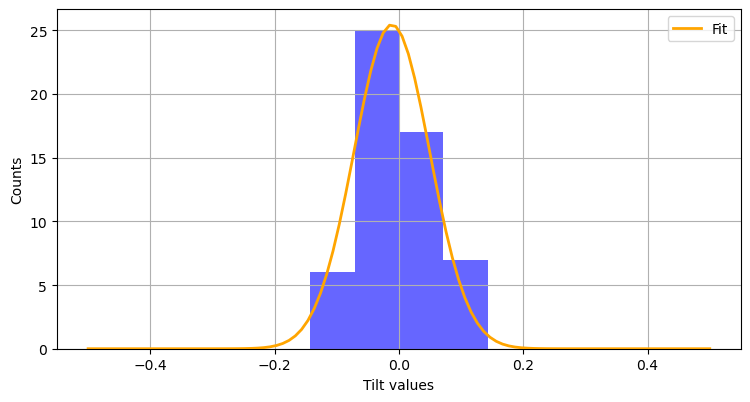

In [69]:
plt.figure(figsize=(30, 15))
gs = GridSpec(3, 3, height_ratios=[1, 1, 1])  
ax1 = plt.subplot(gs[0, 0])

# Tilt data
tilt_vals = tilt_vals
bins_tilt_hist = np.linspace(-.5, .5, 15)
n_tilt, bins_tilt, _ = ax1.hist(tilt_vals, bins=bins_tilt_hist, color='blue', alpha=0.6, lw=2, zorder=1)
x_vals_tilt = 0.5 * (bins_tilt[:-1] + bins_tilt[1:])

x = np.linspace(-.5, .5, 100)
fit, error = fit_gaussian(x_vals_tilt, n_tilt)
print([item for item in fit])
print([item for item in error])

ax1.plot(x, gaussian(x, *fit), lw=2, color='orange', ls='solid', zorder=4,label=r"Fit")
ax1.set_xlabel('Tilt values')
ax1.set_ylabel('Counts')
ax1.legend()
ax1.grid()

muf.save_figures(PlotDir, name='monogem_rma_tilt_histogram')

plt.show()

[49.97463627345515, 1.04709219862131, 0.05977659987572859]
[1.1318235092586233, 0.002589466768029332, 0.0015953475783845406]


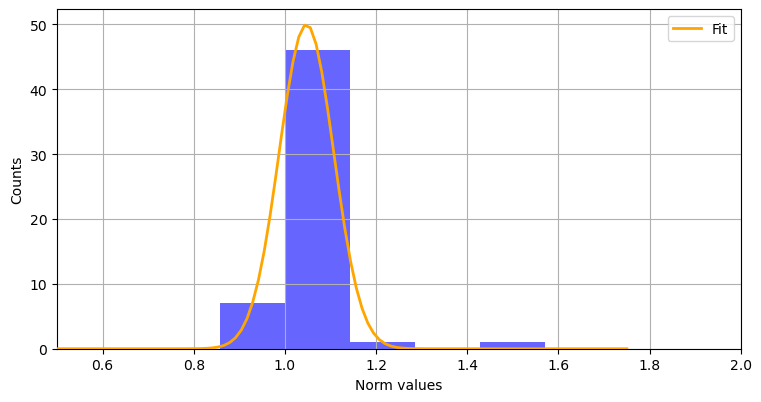

In [72]:
plt.figure(figsize=(30, 15))
gs = GridSpec(3, 3, height_ratios=[1, 1, 1])  
ax2 = plt.subplot(gs[0, 0])

# Norm data
norm_vals = norm_vals
bins_norm_hist = np.linspace(0, 2, 15)
n_norm, bins_norm, _ = ax2.hist(norm_vals, bins=bins_norm_hist, color='blue', alpha=0.6, lw=2, zorder=1)
x_vals_norm = 0.5 * (bins_norm[:-1] + bins_norm[1:])

x = np.linspace(.5, 1.75, 100)
fit, error = fit_gaussian(x_vals_norm, n_norm)
print([item for item in fit])
print([item for item in error])

ax2.plot(x, gaussian(x, *fit), lw=2, color='orange', ls='solid', zorder=4,label=r"Fit")


ax2.set_xlabel('Norm values')
ax2.set_ylabel('Counts')
ax2.legend()
ax2.grid()
ax2.set_xlim(.5, 2)

muf.save_figures(PlotDir, name='monogem_rma_norm_histogram')

plt.show()

# Plots

In [11]:
stacked = MapDataset.read('/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/results/stacked_monogem.fits.gz')

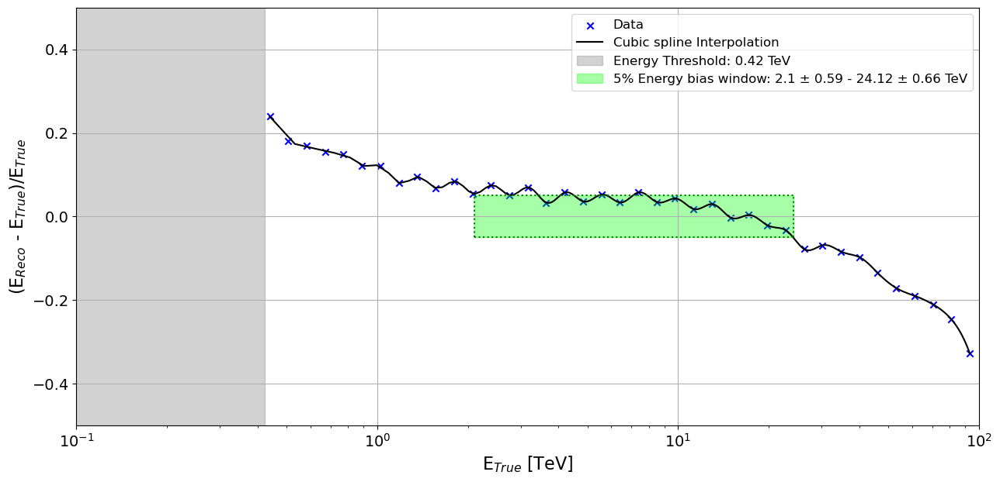

In [12]:
from scipy.interpolate import interp1d
from scipy.optimize import fsolve
from scipy.misc import derivative  # Import derivative for error propagation

bias_percent = 5

# Obtain energy and bias data
energy = np.array(stacked.edisp.get_edisp_kernel().axes["energy_true"].center)
energy_min = stacked.energy_range_total[0].value
bias = np.array(stacked.edisp.get_edisp_kernel().get_bias(energy))

mask = (energy >= energy_min)

# Filtered data
x = energy[mask]
y = bias[mask]

# Create a cubic spline interpolation function with extrapolation
f_cubic = interp1d(x, y, kind='cubic', fill_value='extrapolate')

# Find energies and errors for bias 0.05 and bias 0
bias_energy_below_5_percent_low, error_low = find_energy_with_sensitivity(f_cubic, bias_percent*1e-2, initial_guess=0)
bias_energy_below_5_percent_high, error_high = find_energy_with_sensitivity(f_cubic, -bias_percent*1e-2, initial_guess=20)

# Plotting
fig, (ax1) = plt.subplots(1, 1, figsize=(15, 7))

# Scatter plot of bias data
ax1.scatter(x, y, marker ='x', label='Data', color='blue')

# Interpolation plot
x_new = np.linspace(min(x), max(x), 1000)
y_new = f_cubic(x_new)
ax1.plot(x_new, y_new, label='Cubic spline Interpolation', color='black')

# Energy threshold area
ax1.axvspan(xmin=0, xmax=stacked.energy_range_total[0].value, color='grey', alpha=.35, label=f'Energy Threshold: {round(stacked.energy_range_total[0].value, 2)} TeV')

# Vertical lines for bias energy thresholds
ax1.vlines(bias_energy_below_5_percent_low, -bias_percent*1e-2, bias_percent*1e-2, ls=':', color='green')
ax1.vlines(bias_energy_below_5_percent_high, -bias_percent*1e-2, bias_percent*1e-2, ls=':', color='green')

# Horizontal lines for bias threshold
ax1.hlines(bias_percent*1e-2, bias_energy_below_5_percent_low, bias_energy_below_5_percent_high, ls=':', color='green')
ax1.hlines(-bias_percent*1e-2, bias_energy_below_5_percent_low, bias_energy_below_5_percent_high, ls=':', color='green')

# Label for the bias window
label_box = (f'{bias_percent}% Energy bias window: {round(bias_energy_below_5_percent_low, 2)} ± {round(error_low, 2)} - 'f'{round(bias_energy_below_5_percent_high, 2)} ± {round(error_high, 2)} TeV')
ax1.axvspan(xmin=bias_energy_below_5_percent_low, xmax=bias_energy_below_5_percent_high, ymin=0.45, ymax=.55, color='lime', alpha=.35, label=label_box)

# Set limits and labels
ax1.set_xlim(1e-1, 1e2)
ax1.set_ylim(-0.5, 0.5)
ax1.set_xlabel('E$_{True}$ [TeV]', fontsize=16)
ax1.set_ylabel(r'(E$_{Reco}$ - E$_{True}$)/E$_{True}$', fontsize=16)
ax1.legend(fontsize=12)
ax1.grid()
ax1.set_xscale('log')

ax1.tick_params(axis='both', which='major', labelsize=14)  # Increase the tick size for major ticks
ax1.tick_params(axis='both', which='minor', labelsize=14)  # Optionally adjust for minor ticks


# Save the figure if needed
muf.save_figures(PlotDir, name='monogem_rma_bias_stacked_dataset')


plt.show()

In [16]:
Excess_map_estimator = ExcessMapEstimator(correlation_radius=.6*u.deg,energy_edges=[.1, 100] * u.TeV)
result = Excess_map_estimator.run(stacked)
significance_map = result.sqrt_ts

plt.show()

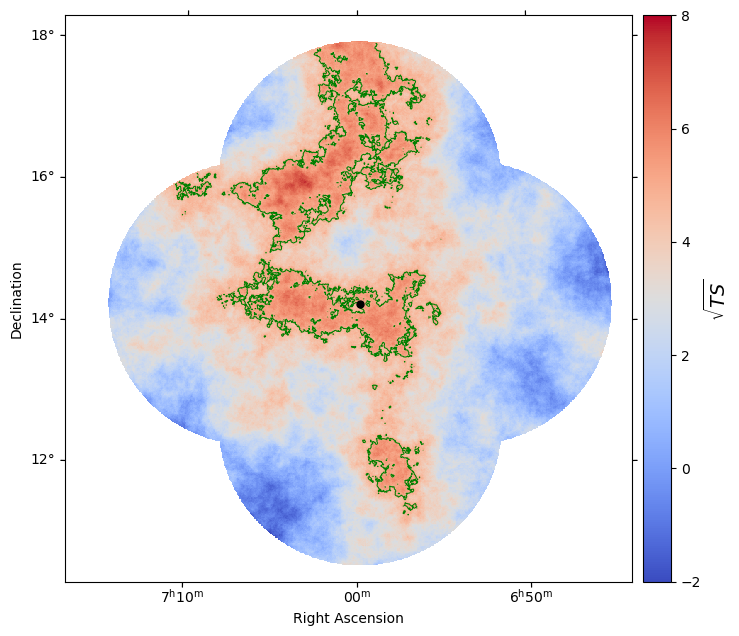

In [17]:
color = ['green']
significance_array = np.squeeze(significance_map)

plt.figure(figsize=(30, 25))
gs = GridSpec(3, 3, height_ratios=[1, 1, 1])  
################################################################################################################################
ax1 = plt.subplot(gs[0, 0], projection=significance_map.geom.wcs)

significance_map.plot(ax=ax1, add_cbar=True, cmap='coolwarm', vmin=-2, vmax=8)

ax1.contour(significance_array, levels=[5], colors=color, linewidths = .75)

marker_psr = dict(marker='o', color='black', markersize=5)
plot_position(ax1, 104.95, 14.24, '', marker_psr) # PSR J1028-5819

ax1.text(99.75, 14.24, r"$\sqrt{TS}$", color='black', transform=ax1.get_transform('world'), rotation=90, ha='center', va='center', fontsize=14, weight='bold')

# muf.save_figures(PlotDir, name="monogem_rma_sqrt_ts_map")

plt.show()

# Modeling

## Many Models 

In [1253]:
dataset_without_model = MapDataset.read('/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/results/Monogem_stacked_Dataset.fits.gz', name='Monogem_stacked_Dataset')
dataset_exp_cutoff_fit = MapDataset.read('/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/results/Monogem_stacked_Dataset.fits.gz', name='Monogem_stacked_Dataset')

geom_mask_exp_001 = dataset_exp_cutoff_fit.counts.geom
energy_mask_exp_001 = dataset_exp_cutoff_fit.counts.geom.energy_mask(energy_min=.1 * u.TeV, energy_max=100 * u.TeV)
dataset_exp_cutoff_fit.mask_fit = Map.from_geom(geom=geom_mask_exp_001, data=energy_mask_exp_001.data)

### Modelling

#### Top

In [1290]:
Centre = SkyCoord(ra_top, dec_top, unit='deg', frame='icrs')
dataset_without_model_top = dataset_without_model.cutout(Centre, width=(4, 4)*u.deg)
dataset_exp_cutoff_fit_top = dataset_exp_cutoff_fit.cutout(Centre, width=(4,4)*u.deg)

geom_mask_exp_001 = dataset_exp_cutoff_fit_top.counts.geom
energy_mask_exp_001 = dataset_exp_cutoff_fit_top.counts.geom.energy_mask(energy_min=.1 * u.TeV, energy_max=100 * u.TeV)
dataset_exp_cutoff_fit_top.mask_fit = Map.from_geom(geom=geom_mask_exp_001, data=energy_mask_exp_001.data)

In [1412]:
# spectral_model_top = PowerLawSpectralModel(index = 2.5, amplitude = 2e-11 * u.Unit("1 / (cm2 s TeV)"), reference = 1 * u.TeV)
spectral_model_top = ExpCutoffPowerLawSpectralModel(index=1.948, amplitude=2.697e-11 * u.Unit("1 / (cm2 s TeV)"), lambda_=1.397e-01 * u.Unit("TeV-1"), reference=1 * u.TeV)

#####################################################################################################################################################################################
ra_top_left = 1.063e+02
dec_top_left = 1.575e+01

spatial_model_top_left = GaussianSpatialModel(lon_0= ra_top_left * u.deg,
                                         lat_0= dec_top_left * u.deg,
                                         sigma =.5 * u.deg,
                                         e=1.090e-09,
                                         phi=0 * u.deg,
                                         frame="icrs"
                                        )

sky_model_top_left = SkyModel(spatial_model=spatial_model_top_left, spectral_model=spectral_model_top, name = 'Source model top left')

sky_model_top_left.parameters['e'].frozen = False
sky_model_top_left.parameters['phi'].frozen = False

sky_model_top_left.parameters['lon_0'].frozen = False
spatial_model_top_left.lon_0.min = ra_top_left - .75
spatial_model_top_left.lon_0.max = ra_top_left + .75

sky_model_top_left.parameters['lat_0'].frozen = False
spatial_model_top_left.lat_0.min = dec_top_left - .75
spatial_model_top_left.lat_0.max = dec_top_left + .75

sky_model_top_left.parameters['sigma'].frozen = False
spatial_model_top_left.sigma.min = .4
spatial_model_top_left.sigma.max = .8

sky_model_top_left.parameters['index'].frozen = False
sky_model_top_left.parameters['amplitude'].frozen = False
sky_model_top_left.parameters['lambda_'].frozen = False

#####################################################################################################################################################################################
ra_top_right = 105
dec_top_right = 17

spatial_model_top_right = GaussianSpatialModel(lon_0= ra_top_right * u.deg,
                                         lat_0= dec_top_right * u.deg,
                                         sigma=.5 * u.deg,
                                         e=1.727e-08, 
                                         phi=0 * u.deg,
                                         frame="icrs"
                                        )


sky_model_top_right = SkyModel(spatial_model=spatial_model_top_right, spectral_model=spectral_model_top, name = 'Source model top right')

sky_model_top_right.parameters['e'].frozen = False
sky_model_top_right.parameters['phi'].frozen = False

sky_model_top_right.parameters['lon_0'].frozen = False
spatial_model_top_right.lon_0.min = ra_top_right - .75
spatial_model_top_right.lon_0.max = ra_top_right + .75

sky_model_top_right.parameters['lat_0'].frozen = False
spatial_model_top_right.lat_0.min = dec_top_right - .75
spatial_model_top_right.lat_0.max = dec_top_right + .75

sky_model_top_right.parameters['sigma'].frozen = False
spatial_model_top_right.sigma.min = .4
spatial_model_top_right.sigma.max = .8

sky_model_top_right.parameters['index'].frozen = False
sky_model_top_right.parameters['amplitude'].frozen = False
sky_model_top_right.parameters['lambda_'].frozen = False

#####################################################################################################################################################################################
models_exp_cutoff_spec_top = Models([sky_model_top_left, sky_model_top_right])
dataset_exp_cutoff_fit_top.models = models_exp_cutoff_spec_top

In [1413]:
fit_exp_cutoff_spec_top = Fit()
print(f'Starting the fit process')
result_exp_cutoff_spec_top = fit_exp_cutoff_spec_top.run([dataset_exp_cutoff_fit_top])

Starting the fit process


In [1414]:
print(result_exp_cutoff_spec_top)

OptimizeResult

	backend    : minuit
	method     : migrad
	success    : True
	message    : Optimization terminated successfully.
	nfev       : 909
	total stat : 133238.91

CovarianceResult

	backend    : minuit
	method     : hesse
	success    : True
	message    : Hesse terminated successfully.



In [1415]:
# Convert the Astropy Table to a Pandas DataFrame
df_top = models_exp_cutoff_spec_top.to_parameters_table().to_pandas()

# Optional: Set Pandas display options for better readability
pd.set_option('display.float_format', lambda x: '%.3e' % x)  # Scientific notation
pd.set_option('display.max_columns', None)  # Display all columns

# Pretty-print the DataFrame
df_top

,model,type,name,value,unit,error,min,max,frozen,is_norm,link,prior
0,Source model top left,,index,1.955e+00,,2.412e-01,NaN,NaN,False,False,,
1,Source model top left,,amplitude,1.256e-11,TeV-1 s-1 cm-2,1.837e-12,NaN,NaN,False,True,,
2,Source model top left,,reference,1.000e+00,TeV,0.000e+00,NaN,NaN,True,False,,
3,Source model top left,,lambda_,1.299e-01,TeV-1,5.954e-02,NaN,NaN,False,False,,
4,Source model top left,,alpha,1.000e+00,,0.000e+00,NaN,NaN,True,False,,
5,Source model top left,,lon_0,1.064e+02,deg,2.183e-01,1.055e+02,1.070e+02,False,False,,
6,Source model top left,,lat_0,1.577e+01,deg,2.063e-01,1.500e+01,1.650e+01,False,False,,
7,Source model top left,,sigma,8.000e-01,deg,6.418e-06,4.000e-01,8.000e-01,False,False,,
8,Source model top left,,e,6.558e-11,,1.145e-05,0.000e+00,1.000e+00,False,False,,
9,Source model top left,,phi,3.459e-11,deg,1.414e+00,NaN,NaN,False,False,,


In [1416]:
delta_ts_top, significance_model_top = muf.model_significance(dataset_exp_cutoff_fit_top, dataset_without_model_top)

Test Statistic: 147.42575233709067
Significance: 9.950404648500893


In [1417]:
estimator = ExcessMapEstimator(correlation_radius = ".7 deg", energy_edges=[1, 100] * u.TeV)
lima_maps_without_model_top = estimator.run(dataset_without_model_top)
significance_map_without_model_top = lima_maps_without_model_top["sqrt_ts"]


estimator_with_model = ExcessMapEstimator(correlation_radius = ".3 deg", energy_edges=[1, 100] * u.TeV)
lima_maps_exp_cutoff_spec_top = estimator_with_model.run(dataset_exp_cutoff_fit_top)
significance_map_exp_cutoff_spec_top = lima_maps_exp_cutoff_spec_top["sqrt_ts"]

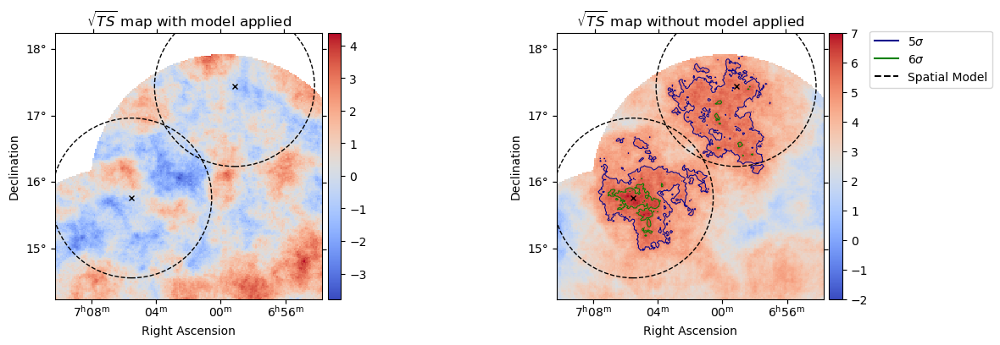

In [1418]:
# Model center's
lon_model_top_left = sky_model_top_left.spatial_model.lon_0.value
lat_model_top_left = sky_model_top_left.spatial_model.lat_0.value
position_model_top_left = SkyCoord(lon_model_top_left, lat_model_top_left, frame='icrs', unit='deg')

lon_model_top_right = sky_model_top_right.spatial_model.lon_0.value
lat_model_top_right = sky_model_top_right.spatial_model.lat_0.value
position_model_top_right = SkyCoord(lon_model_top_right, lat_model_top_right, frame='icrs', unit='deg')


# Define center position marker
color_model = 'black'
center_marker = dict(marker='x', color=color_model, markersize=5)
model_legend = Line2D([0], [0], color=color_model, linestyle='--', label=rf'Spatial Model')

# Plotting
plt.figure(figsize=(14, 9))

################################################################################################################################
ax1 = plt.subplot(221, projection=significance_map_exp_cutoff_spec_top.geom.wcs)
ax1.set_title(r"$\sqrt{TS}$ map with model applied")
significance_map_exp_cutoff_spec_top.plot(ax=ax1, add_cbar=True, cmap='coolwarm')

# Plot the regions of the models
ax1.plot(position_model_top_left.ra.deg, position_model_top_left.dec.deg, **center_marker, transform=ax1.get_transform('world'))
ax1.plot(position_model_top_right.ra.deg, position_model_top_right.dec.deg, **center_marker, transform=ax1.get_transform('world'))
dataset_exp_cutoff_fit_top.models.plot_regions(ax=ax1, color=color_model, ls='--')

################################################################################################################################
ax2 = plt.subplot(222, projection=significance_map_without_model_top.geom.wcs)
ax2.set_title(r"$\sqrt{TS}$ map without model applied")

significance_map_without_model_top.plot(ax=ax2, add_cbar=True, cmap='coolwarm', vmin=-2, vmax=7)

sigma_level = [5, 6]  
color = ['darkblue', 'green']
significance_array = np.squeeze(significance_map_without_model_top)
contours = ax2.contour(significance_array, levels=sigma_level, colors=color, linewidths = .75)
contour_legend = Line2D([0], [0], color=color[0], label=rf'{sigma_level[0]}$\sigma$')
contour_legend_1 = Line2D([0], [0], color=color[1], label=rf'{sigma_level[1]}$\sigma$')
ax2.legend(handles=[contour_legend, contour_legend_1, model_legend], loc='center left', bbox_to_anchor=(1.15, 0.9))

# Plot the regions of the models
ax2.plot(position_model_top_left.ra.deg, position_model_top_left.dec.deg, **center_marker, transform=ax2.get_transform('world'))
ax2.plot(position_model_top_right.ra.deg, position_model_top_right.dec.deg, **center_marker, transform=ax2.get_transform('world'))
dataset_exp_cutoff_fit_top.models.plot_regions(ax=ax2, color=color_model, ls='--')

# muf.save_figures('{}/model_plots/gaussian_spatial_exp_cutoff_pwl_spectral/'.format(PlotDir), name='top_comparsion_with_and_without_model_ts_maps')

plt.show()

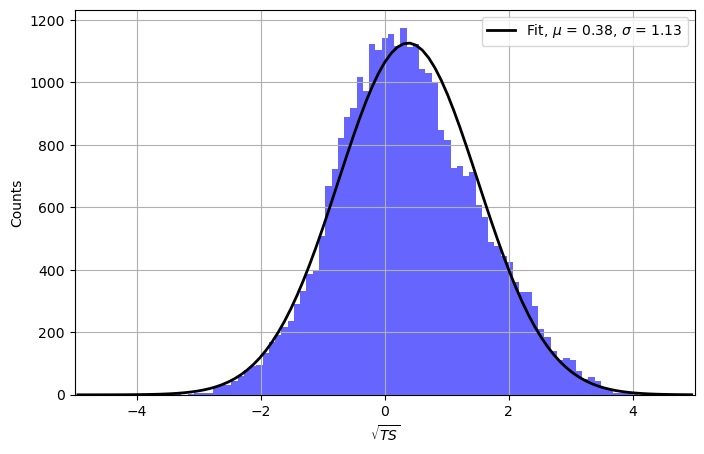

In [1419]:
mask = np.isfinite(significance_map_exp_cutoff_spec_top.data) 
significance_data = significance_map_exp_cutoff_spec_top.data[mask]

plt.figure(figsize=(8, 5))

bins = np.linspace(-5, 5, 100)
n, bins_, _ = plt.hist(significance_data, bins=bins, color='blue', alpha=0.6, lw=2, zorder=1)
x_vals = 0.5 * (bins_[:-1] + bins_[1:])
mu, std = norm.fit(significance_data)
y = norm.pdf(x_vals, mu, std) * sum(n * np.diff(bins_))

plt.plot(x_vals, y, lw=2, color="black", label=r"Fit, $\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu, std))

plt.legend()
plt.xlim(-5, 5)
plt.xlabel(r'$\sqrt{TS}$')
plt.ylabel('Counts')
plt.grid()

# muf.save_figures('{}/model_plots/gaussian_spatial_exp_cutoff_pwl_spectral/'.format(PlotDir), name='top_sqrt_ts_histogram_with_model')

plt.show()

#### Centre

In [1420]:
# Sky Model centre for the centre emission
ra_centre = 105.2
dec_centre = 14

Centre = SkyCoord(ra_centre, dec_centre, unit='deg', frame='icrs')
dataset_without_model_centre = dataset_without_model.cutout(Centre, width=(8, 3)*u.deg)
dataset_exp_cutoff_fit_centre = dataset_exp_cutoff_fit.cutout(Centre, width=(8, 3)*u.deg)

geom_mask_exp_001 = dataset_exp_cutoff_fit_centre.counts.geom
energy_mask_exp_001 = dataset_exp_cutoff_fit_centre.counts.geom.energy_mask(energy_min=.1 * u.TeV, energy_max=100 * u.TeV)
dataset_exp_cutoff_fit_centre.mask_fit = Map.from_geom(geom=geom_mask_exp_001, data=energy_mask_exp_001.data)

In [1446]:
spatial_model_centre = GaussianSpatialModel(lon_0= ra_centre * u.deg,
                                            lat_0= dec_centre * u.deg,
                                            sigma = 1.5 * u.deg,
                                            e=.5,
                                            phi=90 * u.deg,
                                            frame="icrs")

# spectral_model_centre = PowerLawSpectralModel(index = 2.5, amplitude = 2e-11 * u.Unit("1 / (cm2 s TeV)"), reference = 1 * u.TeV)

spectral_model_centre = ExpCutoffPowerLawSpectralModel(index = 1.83, amplitude = 2e-11 * u.Unit("1 / (cm2 s TeV)"), lambda_=0.1 * u.Unit("TeV-1"), reference = 1 * u.TeV)

sky_model_centre = SkyModel(spatial_model=spatial_model_centre, spectral_model=spectral_model_centre, name = 'Source model centre')

sky_model_centre.parameters['e'].frozen = False
sky_model_centre.parameters['phi'].frozen = False
sky_model_centre.parameters['lon_0'].frozen = False
spatial_model_centre.lon_0.min = ra_centre - .75
spatial_model_centre.lon_0.max = ra_centre + .75
sky_model_centre.parameters['lat_0'].frozen = False
spatial_model_centre.lat_0.min = dec_centre - .75
spatial_model_centre.lat_0.max = dec_centre + .75
sky_model_centre.parameters['sigma'].frozen = False

sky_model_centre.parameters['index'].frozen = False
sky_model_centre.parameters['amplitude'].frozen = False
sky_model_centre.parameters['lambda_'].frozen = False

models_exp_cutoff_spec_centre = Models([sky_model_centre])
dataset_exp_cutoff_fit_centre.models = models_exp_cutoff_spec_centre

In [1447]:
fit_exp_cutoff_spec_centre = Fit()
print(f'Starting the fit process')
result_exp_cutoff_spec_centre = fit_exp_cutoff_spec_centre.run([dataset_exp_cutoff_fit_centre])

Starting the fit process


In [1448]:
print(result_exp_cutoff_spec_centre)

OptimizeResult

	backend    : minuit
	method     : migrad
	success    : True
	message    : Optimization terminated successfully.
	nfev       : 970
	total stat : 221494.95

CovarianceResult

	backend    : minuit
	method     : hesse
	success    : True
	message    : Hesse terminated successfully.



In [1449]:
# Convert the Astropy Table to a Pandas DataFrame
df_centre = models_exp_cutoff_spec_centre.to_parameters_table().to_pandas()

# Optional: Set Pandas display options for better readability
pd.set_option('display.float_format', lambda x: '%.3e' % x)  # Scientific notation
pd.set_option('display.max_columns', None)  # Display all columns

# Pretty-print the DataFrame
df_centre

,model,type,name,value,unit,error,min,max,frozen,is_norm,link,prior
0,Source model centre,,index,1.083e+00,,1.783e-01,NaN,NaN,False,False,,
1,Source model centre,,amplitude,2.802e-11,TeV-1 s-1 cm-2,1.147e-11,NaN,NaN,False,True,,
2,Source model centre,,reference,1.000e+00,TeV,0.000e+00,NaN,NaN,True,False,,
3,Source model centre,,lambda_,3.178e-01,TeV-1,5.130e-02,NaN,NaN,False,False,,
4,Source model centre,,alpha,1.000e+00,,0.000e+00,NaN,NaN,True,False,,
5,Source model centre,,lon_0,1.056e+02,deg,4.579e-01,1.045e+02,1.060e+02,False,False,,
6,Source model centre,,lat_0,1.380e+01,deg,3.379e-01,1.325e+01,1.475e+01,False,False,,
7,Source model centre,,sigma,2.301e+00,deg,5.570e-01,0.000e+00,NaN,False,False,,
8,Source model centre,,e,8.331e-01,,2.247e-01,0.000e+00,1.000e+00,False,False,,
9,Source model centre,,phi,7.958e+01,deg,1.542e+01,NaN,NaN,False,False,,


In [1450]:
delta_ts_centre, significance_model_centre = muf.model_significance(dataset_exp_cutoff_fit_centre, dataset_without_model_centre)

Test Statistic: 142.8311526767793
Significance: 10.747147028290794


In [1451]:
estimator = ExcessMapEstimator(correlation_radius = ".7 deg", energy_edges=[1, 100] * u.TeV)

lima_maps_without_model_centre = estimator.run(dataset_without_model_centre)
significance_map_without_model_centre = lima_maps_without_model_centre["sqrt_ts"]

lima_maps_exp_cutoff_spec_centre = estimator.run(dataset_exp_cutoff_fit_centre)
significance_map_exp_cutoff_spec_centre = lima_maps_exp_cutoff_spec_centre["sqrt_ts"]

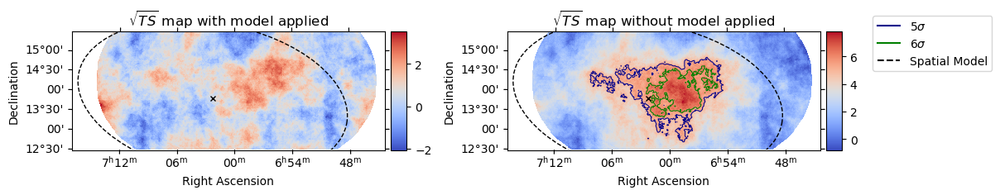

In [1452]:
# Model center's
lon_model_centre = sky_model_centre.spatial_model.lon_0.value
lat_model_centre = sky_model_centre.spatial_model.lat_0.value
position_model_centre = SkyCoord(lon_model_centre, lat_model_centre, frame='icrs', unit='deg')

# Define center position marker
color_model = 'black'
center_marker = dict(marker='x', color=color_model, markersize=5)
model_legend = Line2D([0], [0], color=color_model, linestyle='--', label=rf'Spatial Model')

# Plotting
plt.figure(figsize=(12, 9))

################################################################################################################################
ax1 = plt.subplot(221, projection=significance_map_exp_cutoff_spec_centre.geom.wcs)
ax1.set_title(r"$\sqrt{TS}$ map with model applied")
significance_map_exp_cutoff_spec_centre.plot(ax=ax1, add_cbar=True, cmap='coolwarm')#, vmin=-1, vmax=1)

# Plot the regions of the models
ax1.plot(position_model_centre.ra.deg, position_model_centre.dec.deg, **center_marker, transform=ax1.get_transform('world'))
dataset_exp_cutoff_fit_centre.models.plot_regions(ax=ax1, color=color_model, ls='--')

################################################################################################################################
ax2 = plt.subplot(222, projection=significance_map_without_model_centre.geom.wcs)
ax2.set_title(r"$\sqrt{TS}$ map without model applied")

significance_map_without_model_centre.plot(ax=ax2, add_cbar=True, cmap='coolwarm')#, vmin=-2, vmax=7)

# Plot in the 5 & 6 sigma contours
sigma_level = [5, 6]  
color = ['darkblue', 'green']
significance_array = np.squeeze(significance_map_without_model_centre)
contours = ax2.contour(significance_array, levels=sigma_level, colors=color, linewidths = .75)
contour_legend = Line2D([0], [0], color=color[0], label=rf'{sigma_level[0]}$\sigma$')
contour_legend_1 = Line2D([0], [0], color=color[1], label=rf'{sigma_level[1]}$\sigma$')
ax2.legend(handles=[contour_legend, contour_legend_1, model_legend], loc='center left', bbox_to_anchor=(1.15, 0.9))

# Plot the regions of the models
ax2.plot(position_model_centre.ra.deg, position_model_centre.dec.deg, **center_marker, transform=ax2.get_transform('world'))
dataset_exp_cutoff_fit_centre.models.plot_regions(ax=ax2, color=color_model, ls='--')

plt.subplots_adjust(wspace=0.3, hspace=0.3)

# muf.save_figures('{}/model_plots/gaussian_spatial_pwl_spectral/'.format(PlotDir), name='centre_comparsion_with_and_without_model_ts_maps')

plt.show()

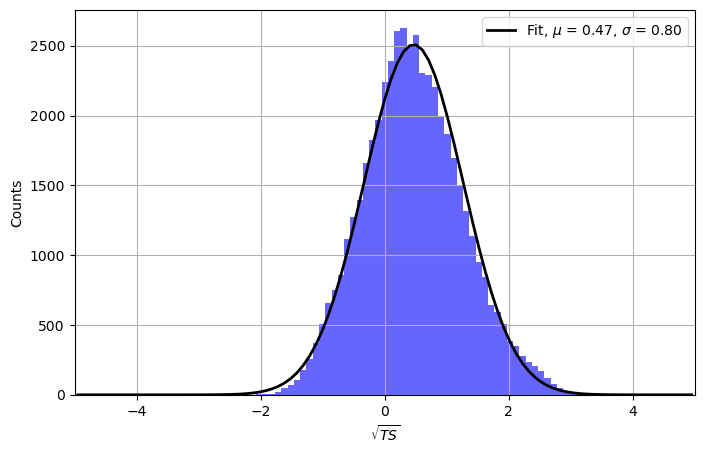

In [1453]:
mask = np.isfinite(significance_map_exp_cutoff_spec_centre.data) 
significance_data = significance_map_exp_cutoff_spec_centre.data[mask]

plt.figure(figsize=(8, 5))

bins = np.linspace(-5, 5, 100)
n, bins_, _ = plt.hist(significance_data, bins=bins, color='blue', alpha=0.6, lw=2, zorder=1)
x_vals = 0.5 * (bins_[:-1] + bins_[1:])
mu, std = norm.fit(significance_data)
y = norm.pdf(x_vals, mu, std) * sum(n * np.diff(bins_))

plt.plot(x_vals, y, lw=2, color="black", label=r"Fit, $\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu, std))

plt.legend()
plt.xlim(-5, 5)
plt.xlabel(r'$\sqrt{TS}$')
plt.ylabel('Counts')
plt.grid()

# muf.save_figures('{}/model_plots/gaussian_spatial_exp_cutoff_pwl_spectral/'.format(PlotDir), name='centre_sqrt_ts_histogram_with_model')

plt.show()

#### Bottom

In [1467]:
# Sky Model bottom for the bottom emission
ra_bottom = 104.5
dec_bottom = 11.75

Centre = SkyCoord(ra_bottom, dec_bottom, unit='deg', frame='icrs')
dataset_without_model_bottom = dataset_without_model.cutout(Centre, width=(4, 4)*u.deg)
dataset_exp_cutoff_fit_bottom = dataset_exp_cutoff_fit.cutout(Centre, width=(4, 4)*u.deg)

geom_mask_exp_001 = dataset_exp_cutoff_fit_bottom.counts.geom
energy_mask_exp_001 = dataset_exp_cutoff_fit_bottom.counts.geom.energy_mask(energy_min=.1 * u.TeV, energy_max=100 * u.TeV)
dataset_exp_cutoff_fit_bottom.mask_fit = Map.from_geom(geom=geom_mask_exp_001, data=energy_mask_exp_001.data)

In [1476]:
# Sky Model bottom for the bottom emission
ra_bottom = 104.5
dec_bottom = 12.1

spatial_model_bottom = GaussianSpatialModel(lon_0= ra_bottom* u.deg,
                                            lat_0= dec_bottom* u.deg,
                                            sigma = .9 * u.deg,
                                            e=.7,
                                            phi=195 * u.deg,
                                            frame="icrs")

#spectral_model_bottom = PowerLawSpectralModel(index = 2.5, amplitude = 2e-11 * u.Unit("1 / (cm2 s TeV)"), reference = 1 * u.TeV)

spectral_model_bottom = ExpCutoffPowerLawSpectralModel(index = 1.634, amplitude = 2e-11 * u.Unit("1 / (cm2 s TeV)"), lambda_=0.1 * u.Unit("TeV-1"), reference = 1 * u.TeV)

sky_model_bottom = SkyModel(spatial_model=spatial_model_bottom, spectral_model=spectral_model_bottom, name = 'Source model bottom')

sky_model_bottom.parameters['e'].frozen = False
sky_model_bottom.parameters['phi'].frozen = False
sky_model_bottom.parameters['lon_0'].frozen = False
spatial_model_bottom.lon_0.min = ra_bottom - .75
spatial_model_bottom.lon_0.max = ra_bottom + .75
sky_model_bottom.parameters['lat_0'].frozen = False
spatial_model_bottom.lat_0.min = dec_bottom - .75
spatial_model_bottom.lat_0.max = dec_bottom + .75
sky_model_bottom.parameters['sigma'].frozen = False
spatial_model_bottom.sigma.min = .5
spatial_model_bottom.sigma.max = 1

sky_model_bottom.parameters['index'].frozen = False
sky_model_bottom.parameters['amplitude'].frozen = False
sky_model_bottom.parameters['lambda_'].frozen = False

models_exp_cutoff_spec_bottom = Models([sky_model_bottom])
dataset_exp_cutoff_fit_bottom.models = models_exp_cutoff_spec_bottom

In [1477]:
fit_exp_cutoff_spec_bottom = Fit()
print(f'Starting the fit process')
result_exp_cutoff_spec_bottom = fit_exp_cutoff_spec_bottom.run([dataset_exp_cutoff_fit_bottom])

Starting the fit process


In [1478]:
print(result_exp_cutoff_spec_bottom)

OptimizeResult

	backend    : minuit
	method     : migrad
	success    : True
	message    : Optimization terminated successfully.
	nfev       : 1388
	total stat : 106189.12

CovarianceResult

	backend    : minuit
	method     : hesse
	success    : True
	message    : Hesse terminated successfully.



In [1479]:
# Convert the Astropy Table to a Pandas DataFrame
df_bottom = models_exp_cutoff_spec_bottom.to_parameters_table().to_pandas()

# Optional: Set Pandas display options for better readability
pd.set_option('display.float_format', lambda x: '%.3e' % x)  # Scientific notation
pd.set_option('display.max_columns', None)  # Display all columns

# Pretty-print the DataFrame
df_bottom

,model,type,name,value,unit,error,min,max,frozen,is_norm,link,prior
0,Source model bottom,,index,1.022e+00,,3.740e-01,NaN,NaN,False,False,,
1,Source model bottom,,amplitude,1.317e-11,TeV-1 s-1 cm-2,3.138e-12,NaN,NaN,False,True,,
2,Source model bottom,,reference,1.000e+00,TeV,0.000e+00,NaN,NaN,True,False,,
3,Source model bottom,,lambda_,3.154e-01,TeV-1,1.001e-01,NaN,NaN,False,False,,
4,Source model bottom,,alpha,1.000e+00,,0.000e+00,NaN,NaN,True,False,,
5,Source model bottom,,lon_0,1.045e+02,deg,2.158e-01,1.038e+02,1.052e+02,False,False,,
6,Source model bottom,,lat_0,1.199e+01,deg,2.598e-01,1.135e+01,1.285e+01,False,False,,
7,Source model bottom,,sigma,1.000e+00,deg,1.804e-04,5.000e-01,1.000e+00,False,False,,
8,Source model bottom,,e,2.615e-06,,2.547e-03,0.000e+00,1.000e+00,False,False,,
9,Source model bottom,,phi,2.140e+02,deg,2.000e+02,NaN,NaN,False,False,,


In [1480]:
delta_ts_bottom, significance_model_bottom = muf.model_significance(dataset_exp_cutoff_fit_bottom, dataset_without_model_bottom)

Test Statistic: 78.54813035510597
Significance: 7.446608375986813


In [1481]:
estimator = ExcessMapEstimator(correlation_radius = ".7 deg", energy_edges=[1,100]*u.TeV)

lima_maps_without_model_bottom = estimator.run(dataset_without_model_bottom)
significance_map_without_model_bottom = lima_maps_without_model_bottom["sqrt_ts"]

estimator_with_model = ExcessMapEstimator(correlation_radius = ".3 deg", energy_edges=[1,100]*u.TeV)
lima_maps_exp_cutoff_spec_bottom = estimator_with_model.run(dataset_exp_cutoff_fit_bottom)
significance_map_exp_cutoff_spec_bottom = lima_maps_exp_cutoff_spec_bottom["sqrt_ts"]

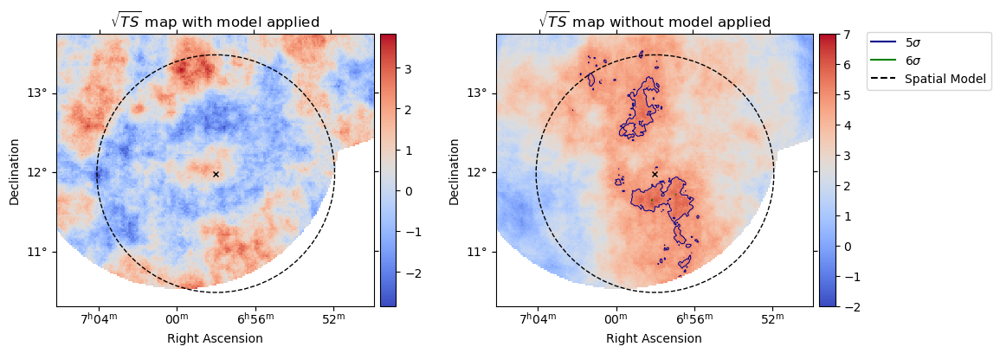

In [1482]:
# Model center's
lon_model_bottom = sky_model_bottom.spatial_model.lon_0.value
lat_model_bottom = sky_model_bottom.spatial_model.lat_0.value
position_model_bottom = SkyCoord(lon_model_bottom, lat_model_bottom, frame='icrs', unit='deg')


# Define center position marker
color_model = 'black'
center_marker = dict(marker='x', color=color_model, markersize=5)
model_legend = Line2D([0], [0], color=color_model, linestyle='--', label=rf'Spatial Model')

# Plotting
plt.figure(figsize=(12, 9))

################################################################################################################################
ax1 = plt.subplot(221, projection=significance_map_exp_cutoff_spec_bottom.geom.wcs)
ax1.set_title(r"$\sqrt{TS}$ map with model applied")
significance_map_exp_cutoff_spec_bottom.plot(ax=ax1, add_cbar=True, cmap='coolwarm')#, vmin=-2, vmax=2)

# Plot the regions of the models
ax1.plot(position_model_bottom.ra.deg, position_model_bottom.dec.deg, **center_marker, transform=ax1.get_transform('world'))
dataset_exp_cutoff_fit_bottom.models.plot_regions(ax=ax1, color=color_model, ls='--')

################################################################################################################################
ax2 = plt.subplot(222, projection=significance_map_without_model_bottom.geom.wcs)
ax2.set_title(r"$\sqrt{TS}$ map without model applied")

significance_map_without_model_bottom.plot(ax=ax2, add_cbar=True, cmap='coolwarm', vmin=-2, vmax=7)

# Plot in the 5 & 6 sigma contours
sigma_level = [5, 6]  
color = ['darkblue', 'green']
significance_array = np.squeeze(significance_map_without_model_bottom)
contours = ax2.contour(significance_array, levels=sigma_level, colors=color, linewidths = .75)
contour_legend = Line2D([0], [0], color=color[0], label=rf'{sigma_level[0]}$\sigma$')
contour_legend_1 = Line2D([0], [0], color=color[1], label=rf'{sigma_level[1]}$\sigma$')
ax2.legend(handles=[contour_legend, contour_legend_1, model_legend], loc='center left', bbox_to_anchor=(1.15, 0.9))

# Plot the regions of the models
ax2.plot(position_model_bottom.ra.deg, position_model_bottom.dec.deg, **center_marker, transform=ax2.get_transform('world'))
dataset_exp_cutoff_fit_bottom.models.plot_regions(ax=ax2, color=color_model, ls='--')

# muf.save_figures('{}/model_plots/gaussian_spatial_pwl_spectral/'.format(PlotDir), name='bottom_comparsion_with_and_without_model_ts_maps')

plt.show()

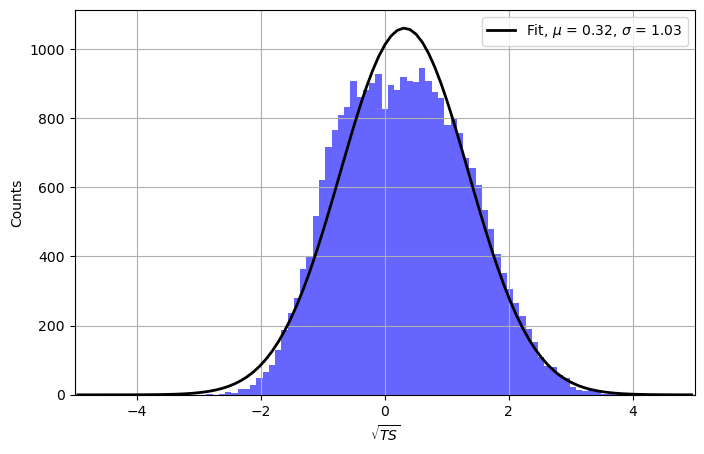

In [1483]:
mask = np.isfinite(significance_map_exp_cutoff_spec_bottom.data) 
significance_data = significance_map_exp_cutoff_spec_bottom.data[mask]

plt.figure(figsize=(8, 5))

bins = np.linspace(-5, 5, 100)
n, bins_, _ = plt.hist(significance_data, bins=bins, color='blue', alpha=0.6, lw=2, zorder=1)
x_vals = 0.5 * (bins_[:-1] + bins_[1:])
mu, std = norm.fit(significance_data)
y = norm.pdf(x_vals, mu, std) * sum(n * np.diff(bins_))

plt.plot(x_vals, y, lw=2, color="black", label=r"Fit, $\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu, std))

plt.legend()
plt.xlim(-5, 5)
plt.xlabel(r'$\sqrt{TS}$')
plt.ylabel('Counts')
plt.grid()

# muf.save_figures('{}/model_plots/gaussian_spatial_exp_cutoff_pwl_spectral/'.format(PlotDir), name='bottom_sqrt_ts_histogram_with_model')

plt.show()

#### All together

In [1488]:
geom_mask_exp_001 = dataset_exp_cutoff_fit.counts.geom
energy_mask_exp_001 = dataset_exp_cutoff_fit.counts.geom.energy_mask(energy_min=.1 * u.TeV, energy_max=100 * u.TeV)
dataset_exp_cutoff_fit.mask_fit = Map.from_geom(geom=geom_mask_exp_001, data=energy_mask_exp_001.data)

In [1496]:
spectral_model = ExpCutoffPowerLawSpectralModel(index=1.5, amplitude=2e-11 * u.Unit("1 / (cm2 s TeV)"), lambda_=0.14 * u.Unit("TeV-1"), reference=1 * u.TeV)

################################################################################################################################################################################################

spatial_model_top_left_final = GaussianSpatialModel(lon_0=1.064e+02 * u.deg, lat_0=15.77 * u.deg, sigma =.8 * u.deg, e=6.558e-11, phi=3.459e-11 * u.deg, frame="icrs")
sky_model_top_left_final = SkyModel(spatial_model=spatial_model_top_left_final, spectral_model=spectral_model, name = 'Source model top left final')

sky_model_top_left_final.parameters['e'].frozen = True
sky_model_top_left_final.parameters['phi'].frozen = True
sky_model_top_left_final.parameters['lon_0'].frozen = True
sky_model_top_left_final.parameters['lat_0'].frozen = True
sky_model_top_left_final.parameters['sigma'].frozen = True


spatial_model_top_right_final = GaussianSpatialModel(lon_0=1.048e+02 * u.deg, lat_0=1.745e+01 * u.deg, sigma=7.994e-01 * u.deg, e=9.903e-08,  phi=0 * u.deg, frame="icrs")
sky_model_top_right_final = SkyModel(spatial_model=spatial_model_top_left_final, spectral_model=spectral_model, name = 'Source model top right final')

sky_model_top_right_final.parameters['e'].frozen = True
sky_model_top_right_final.parameters['phi'].frozen = True
sky_model_top_right_final.parameters['lon_0'].frozen = True
sky_model_top_right_final.parameters['lat_0'].frozen = True
sky_model_top_right_final.parameters['sigma'].frozen = True

################################################################################################################################################################################################

spatial_model_centre_final = GaussianSpatialModel(lon_0=1.056e+02 * u.deg, lat_0= 1.380e+01 * u.deg, sigma =2.301e+00 * u.deg, e=8.331e-01, phi=7.958e+01 * u.deg, frame="icrs")
sky_model_centre_final = SkyModel(spatial_model=spatial_model_centre_final, spectral_model=spectral_model, name = 'Source model centre final')

sky_model_centre_final.parameters['e'].frozen = True
sky_model_centre_final.parameters['phi'].frozen = True
sky_model_centre_final.parameters['lon_0'].frozen = True
sky_model_centre_final.parameters['lat_0'].frozen = True
sky_model_centre_final.parameters['sigma'].frozen = True

################################################################################################################################################################################################

spatial_model_bottom_final = GaussianSpatialModel(lon_0= 1.045e+02 * u.deg, lat_0= 1.199e+01 * u.deg, sigma=1 * u.deg, e=2.615e-06, phi=2.140e+02 * u.deg, frame="icrs")
sky_model_bottom_final = SkyModel(spatial_model=spatial_model_bottom_final, spectral_model=spectral_model, name = 'Source model bottom final')

sky_model_bottom_final.parameters['e'].frozen = True
sky_model_bottom_final.parameters['phi'].frozen = True
sky_model_bottom_final.parameters['lon_0'].frozen = True
sky_model_bottom_final.parameters['lat_0'].frozen = True
sky_model_bottom_final.parameters['sigma'].frozen = True

################################################################################################################################################################################################
models_exp_cutoff_spec_combined = Models([
    sky_model_top_left_final,
    sky_model_top_right_final,
    sky_model_centre_final, 
    sky_model_bottom_final
])

dataset_exp_cutoff_fit.models = models_exp_cutoff_spec_combined

In [1497]:
fit_final = Fit()
print(f'Starting the fit process')
result_final = fit_final.run([dataset_exp_cutoff_fit])

Starting the fit process


In [1498]:
print(result_final)

OptimizeResult

	backend    : minuit
	method     : migrad
	success    : True
	message    : Optimization terminated successfully.
	nfev       : 112
	total stat : 346174.01

CovarianceResult

	backend    : minuit
	method     : hesse
	success    : True
	message    : Hesse terminated successfully.



In [1499]:
delta_ts, significance_model = muf.model_significance(dataset_exp_cutoff_fit, dataset_without_model)

Test Statistic: 197.91441666794708
Significance: 12.487047015196433


In [1500]:
# Convert the Astropy Table to a Pandas DataFrame
df_combined = models_exp_cutoff_spec_combined.to_parameters_table().to_pandas()

# Optional: Set Pandas display options for better readability
pd.set_option('display.float_format', lambda x: '%.3e' % x)  # Scientific notation
pd.set_option('display.max_columns', None)  # Display all columns

# Pretty-print the DataFrame
df_combined

,model,type,name,value,unit,error,min,max,frozen,is_norm,link,prior
0,Source model top left final,,index,1.432e+00,,1.451e-01,NaN,NaN,False,False,,
1,Source model top left final,,amplitude,7.007e-12,TeV-1 s-1 cm-2,9.127e-13,NaN,NaN,False,True,,
2,Source model top left final,,reference,1.000e+00,TeV,0.000e+00,NaN,NaN,True,False,,
3,Source model top left final,,lambda_,2.265e-01,TeV-1,3.797e-02,NaN,NaN,False,False,,
4,Source model top left final,,alpha,1.000e+00,,0.000e+00,NaN,NaN,True,False,,
5,Source model top left final,,lon_0,1.064e+02,deg,0.000e+00,NaN,NaN,True,False,,
6,Source model top left final,,lat_0,1.577e+01,deg,0.000e+00,-9.000e+01,9.000e+01,True,False,,
7,Source model top left final,,sigma,8.000e-01,deg,0.000e+00,0.000e+00,NaN,True,False,,
8,Source model top left final,,e,6.558e-11,,0.000e+00,0.000e+00,1.000e+00,True,False,,
9,Source model top left final,,phi,3.459e-11,deg,0.000e+00,NaN,NaN,True,False,,


In [1501]:
# df_combined.to_csv('/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/Monogem_on_off_bkg/Hess_1u/Individual_matching/gaussian_spatial_pwl_spectral_fit_params.csv')

In [1508]:
estimator = ExcessMapEstimator(correlation_radius = ".7 deg",energy_edges=[1, 100] * u.TeV)
lima_maps_without_model = estimator.run(dataset_without_model)
significance_map_without_model = lima_maps_without_model["sqrt_ts"]

estimator_with_model = ExcessMapEstimator(correlation_radius = ".3 deg",energy_edges=[1, 100] * u.TeV)
lima_maps_exp_cutoff_spec = estimator_with_model.run(dataset_exp_cutoff_fit)
significance_map_exp_cutoff_spec = lima_maps_exp_cutoff_spec["sqrt_ts"]

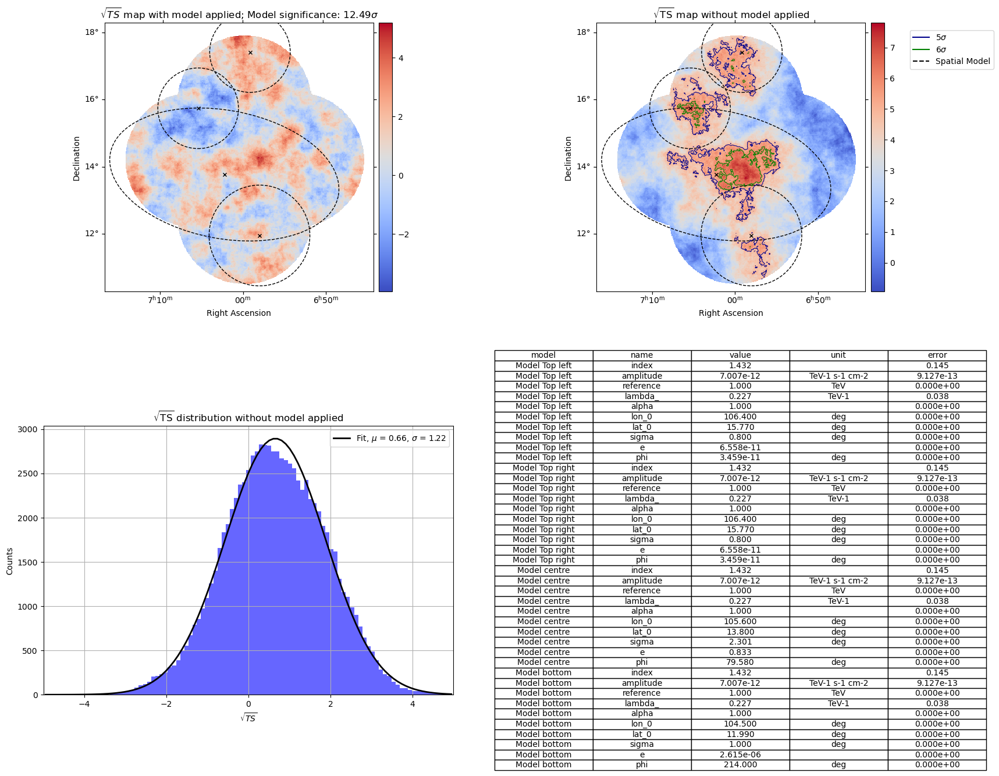

In [1513]:
# Model center's
lon_model_top_left = sky_model_top_left.spatial_model.lon_0.value
lat_model_top_left = sky_model_top_left.spatial_model.lat_0.value
position_model_top_left = SkyCoord(lon_model_top_left, lat_model_top_left, frame='icrs', unit='deg')

lon_model_top_right = sky_model_top_right.spatial_model.lon_0.value
lat_model_top_right = sky_model_top_right.spatial_model.lat_0.value
position_model_top_right = SkyCoord(lon_model_top_right, lat_model_top_right, frame='icrs', unit='deg')

lon_model_centre = sky_model_centre.spatial_model.lon_0.value
lat_model_centre = sky_model_centre.spatial_model.lat_0.value
position_model_centre = SkyCoord(lon_model_centre, lat_model_centre, frame='icrs', unit='deg')

lon_model_bottom = sky_model_bottom.spatial_model.lon_0.value
lat_model_bottom = sky_model_bottom.spatial_model.lat_0.value
position_model_bottom = SkyCoord(lon_model_bottom, lat_model_bottom, frame='icrs', unit='deg')
################################################################################################################################

# Define center position marker
color_model = 'black'
center_marker = dict(marker='x', color=color_model, markersize=5)
model_legend = Line2D([0], [0], color=color_model, linestyle='--', label=rf'Spatial Model')

# Plotting
plt.figure(figsize=(20, 15))
gs = GridSpec(2, 2, height_ratios=[1, 1]) 

################################################################################################################################
ax1 = plt.subplot(gs[0, 0], projection=significance_map_exp_cutoff_spec.geom.wcs)
ax1.set_title(rf"$\sqrt{{TS}}$ map with model applied; Model significance: {significance_model:.2f}$\sigma$")
significance_map_exp_cutoff_spec.plot(ax=ax1, add_cbar=True, cmap='coolwarm')

# Plot the regions of the models
ax1.plot(position_model_top_left.ra.deg, position_model_top_left.dec.deg, **center_marker, transform=ax1.get_transform('world'))
ax1.plot(position_model_top_right.ra.deg, position_model_top_right.dec.deg, **center_marker, transform=ax1.get_transform('world'))
ax1.plot(position_model_centre.ra.deg, position_model_centre.dec.deg, **center_marker, transform=ax1.get_transform('world'))
ax1.plot(position_model_bottom.ra.deg, position_model_bottom.dec.deg, **center_marker, transform=ax1.get_transform('world'))

dataset_exp_cutoff_fit_top.models.plot_regions(ax=ax1, color=color_model, ls='--')
dataset_exp_cutoff_fit_centre.models.plot_regions(ax=ax1, color=color_model, ls='--')
dataset_exp_cutoff_fit_bottom.models.plot_regions(ax=ax1, color=color_model, ls='--')
################################################################################################################################
ax2 = plt.subplot(gs[0, 1], projection=significance_map_without_model.geom.wcs)
ax2.set_title(rf"$\sqrt{{\rm TS}}$ map without model applied")

significance_map_without_model.plot(ax=ax2, add_cbar=True, cmap='coolwarm')

sigma_level = [5, 6]  
color = ['darkblue', 'green']
significance_array = np.squeeze(significance_map_without_model)
contours = ax2.contour(significance_array, levels=sigma_level, colors=color, linewidths = .75)
contour_legend = Line2D([0], [0], color=color[0], label=rf'{sigma_level[0]}$\sigma$')
contour_legend_1 = Line2D([0], [0], color=color[1], label=rf'{sigma_level[1]}$\sigma$')
ax2.legend(handles=[contour_legend, contour_legend_1, model_legend], loc='center left', bbox_to_anchor=(1.15, 0.9))

# Plot the regions of the models
ax2.plot(position_model_top_left.ra.deg, position_model_top_left.dec.deg, **center_marker, transform=ax2.get_transform('world'))
ax2.plot(position_model_top_right.ra.deg, position_model_top_right.dec.deg, **center_marker, transform=ax2.get_transform('world'))
ax2.plot(position_model_centre.ra.deg, position_model_centre.dec.deg, **center_marker, transform=ax2.get_transform('world'))
ax2.plot(position_model_bottom.ra.deg, position_model_bottom.dec.deg, **center_marker, transform=ax2.get_transform('world'))

dataset_exp_cutoff_fit_top.models.plot_regions(ax=ax2, color=color_model, ls='--')
dataset_exp_cutoff_fit_centre.models.plot_regions(ax=ax2, color=color_model, ls='--')
dataset_exp_cutoff_fit_bottom.models.plot_regions(ax=ax2, color=color_model, ls='--')
################################################################################################################################
ax3 = plt.subplot(gs[1, 0]) 
ax3.set_title(rf"$\sqrt{{\rm TS}}$ distribution without model applied")
mask = np.isfinite(significance_map_exp_cutoff_spec.data) 
significance_data = significance_map_exp_cutoff_spec.data[mask]
bins = np.linspace(-5, 5, 100)
n, bins_, _ = plt.hist(significance_data, bins=bins, color='blue', alpha=0.6, lw=2, zorder=1)
x_vals = 0.5 * (bins_[:-1] + bins_[1:])
mu, std = norm.fit(significance_data)
y = norm.pdf(x_vals, mu, std) * sum(n * np.diff(bins_))

plt.plot(x_vals, y, lw=2, color="black", label=r"Fit, $\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu, std))
plt.legend()
plt.xlim(-5, 5)
plt.xlabel(r'$\sqrt{TS}$')
plt.ylabel('Counts')
plt.grid()

################################################################################################################################
# Add the table in ax4
ax4 = plt.subplot(gs[1, 1])
ax4.axis('off')

#ax4.set_title('Fit parameters', fontsize=12, pad=30)  # Adjust the title and padding as needed

# Format and display the table
def format_value(val):
    if pd.isna(val):
        return ''
    elif isinstance(val, float):
        if abs(val) < 1e-3 or abs(val) > 1e3:
            return f'{val:.3e}'
        else:
            return f'{val:.3f}'
    return str(val)

# Update the 'model' column with new names
df_combined.loc[df_combined['model'] == 'Source model top left final', 'model'] = 'Model Top left'
df_combined.loc[df_combined['model'] == 'Source model top right final', 'model'] = 'Model Top right'
df_combined.loc[df_combined['model'] == 'Source model centre final', 'model'] = 'Model centre'
df_combined.loc[df_combined['model'] == 'Source model bottom final', 'model'] = 'Model bottom'
df_formatted = df_combined[['model', 'name', 'value', 'unit', 'error']].applymap(format_value)
table_data = df_formatted.values
columns = df_formatted.columns
table_plot = ax4.table(cellText=table_data, colLabels=columns, cellLoc='center', loc='center')

# Set table style
table_plot.auto_set_font_size(False)
table_plot.set_fontsize(10)
table_plot.scale(1.2, 1.2)  # Adjust the scale as needed

plt.subplots_adjust(hspace=.5)

#muf.save_figures('{}/model_plots/gaussian_spatial_pwl_spectral/'.format(PlotDir), name='OVERVIEW')

plt.show()

### Flux Points

In [1520]:
energy_edges = MapAxis.from_energy_bounds("1 TeV", "100 TeV", nbin=10).edges

fpe_final = FluxPointsEstimator(energy_edges=energy_edges, source='Source model centre final')
flux_points_final = fpe_final.run(datasets=[dataset_exp_cutoff_fit])

flux_names = ['flux_points_final']

In [1524]:
chi2_values = chi_squared_calculator(flux_points_final, flux_names)

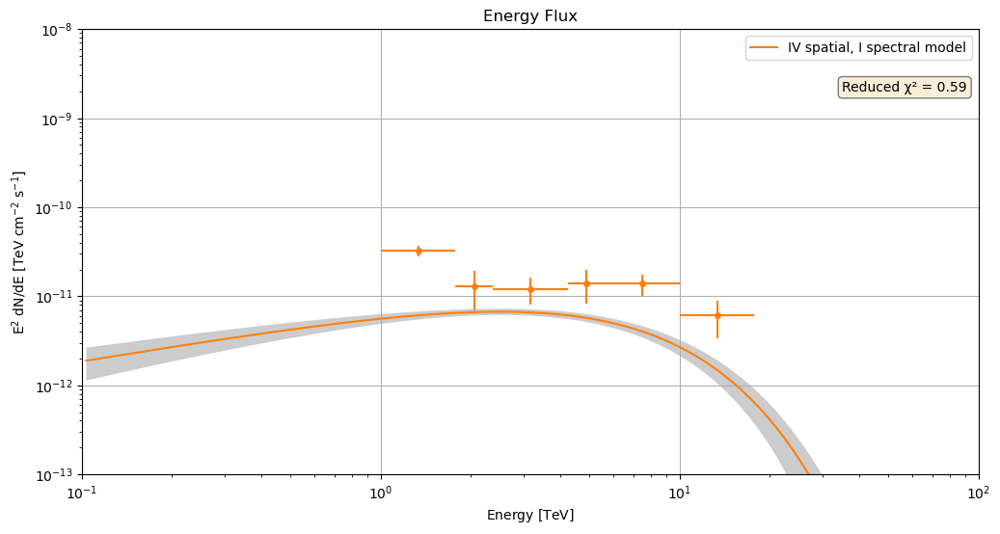

In [1525]:
plt.figure(figsize=(12, 6))
ax = plt.subplot()
ax.set_title('Energy Flux')

flux_points_number = len(np.where(flux_points_final.e2dnde.data[:,0][:,0] > 1e-12)[0])
free_model_params = len(spectral_model_centre.parameters.free_parameters)
DOF = flux_points_number - free_model_params

# Extract flux values
chi_all = chi2_values[flux_names[0]] / DOF

# Plot the spectra
plot_spectrum(sky_model_centre_final, flux_points_final, energy_power=2, label="IV spatial, I spectral model", color='tab:orange')

# Add text with χ² value (assuming `result` is defined elsewhere in your code)
box_style = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
text_str = (f'Reduced χ² = {chi_all:.2f}')

ax.text(35, 2e-9, text_str, color='black', size=10, bbox=box_style)

# Add legend and grid
ax.legend(bbox_to_anchor=(1, 1))
ax.grid()
ax.set_xlim(1e-1, 1e2)
ax.set_ylim(1e-13, 1e-8)

plt.subplots_adjust(hspace=.25)

# muf.save_figures('{}/'.format(Plot_Dir_all), name='one_model_energy_flux')

plt.show()

## One Model to rule them all

### Modelling

In [ ]:
# Optional: Set Pandas display options for better readability
pd.set_option('display.float_format', lambda x: '%.3e' % x)  # Scientific notation
pd.set_option('display.max_columns', None)  # Display all columns

In [1501]:
dataset_without_model_all = MapDataset.read('/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/results/Monogem_stacked_Dataset.fits.gz', name='Monogem_stacked_Dataset')
dataset_one_model = MapDataset.read('/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/results/Monogem_stacked_Dataset.fits.gz', name='Monogem_stacked_Dataset')

In [1502]:
# Sky Model centre for the centre emission
ra_centre = 104.95
dec_centre = 14

dataset_one_model = dataset_one_model.cutout(position=SkyCoord(ra_centre,dec_centre, unit='deg'), width=(3,3)*u.deg,)
dataset_without_model_all = dataset_without_model_all.cutout(position=SkyCoord(ra_centre,dec_centre, unit='deg'), width=(3,3)*u.deg)

In [1503]:
geom_mask_exp_001 = dataset_one_model.counts.geom
energy_mask_exp_001 = dataset_one_model.counts.geom.energy_mask(energy_min=1 * u.TeV, energy_max=100 * u.TeV)
dataset_one_model.mask_fit = Map.from_geom(geom=geom_mask_exp_001, data=energy_mask_exp_001.data)

geom_mask = dataset_without_model_all.counts.geom
energy_mask = dataset_without_model_all.counts.geom.energy_mask(energy_min=1 * u.TeV, energy_max=100 * u.TeV)
dataset_without_model_all.mask_fit = Map.from_geom(geom=geom_mask, data=energy_mask.data)

Plot_Dir_all = '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/Plots/ON_OFF/Individual_matching/model_plots/gaussian_spatial_pwl_spectral/One_model'

In [1341]:
# # Extract the data from the significance map
# min_excess = np.min(lima_maps_without_model_all.npred_excess.data[np.isfinite(lima_maps_without_model_all.npred_excess.data)])

# excess_data = lima_maps_without_model_all.npred_excess.data + np.abs(min_excess)
# significance_data = significance_map_without_model_all.data 

# # Apply the threshold: Set values below 5 to zero or NaN (depending on your need)
# threshold = 5 # np.min(excess_data[np.isfinite(excess_data)])
# filtered_data = np.where(significance_data >= threshold, significance_data, 0)

# m = Map.create(skydir=(ra_centre, dec_centre), width=(8, 8), binsz=0.02, frame="icrs")
# m.data = filtered_data

# m.plot(add_cbar = True, cmap='coolwarm')

In [1698]:
ra = 1.050e+02	
dec = 1.386e+01	
radius = 8.875e-01 

spatial_model_all = GaussianSpatialModel(lon_0 = ra * u.deg,
                                         lat_0 = dec * u.deg, 
                                         sigma = radius * u.deg,
                                         e = 9.537e-07,
                                         phi = 0 * u.deg, 
                                         frame="icrs"
                                        )

# spatial_model_all = TemplateSpatialModel(m)

spectral_model_all = PowerLawSpectralModel(index = 2.781, amplitude = 1.58e-11 * u.Unit("1 / (cm2 s TeV)"), reference = 1 * u.TeV)

#spectral_model_all = ExpCutoffPowerLawSpectralModel(amplitude=5.548e-11	* u.Unit("cm-2 s-1 TeV-1"), index=1.471, lambda_=2.379e-01 * u.Unit("TeV-1"), reference=1 * u.TeV)

sky_model_all = SkyModel(spatial_model = spatial_model_all, spectral_model = spectral_model_all, name = 'Source model all')

sky_model_all.parameters['e'].frozen = True
sky_model_all.parameters['phi'].frozen = True
sky_model_all.parameters['lon_0'].frozen = True
sky_model_all.parameters['lat_0'].frozen = True
sky_model_all.parameters['sigma'].frozen = True

spatial_model_all.lon_0.min = ra - 1
spatial_model_all.lon_0.max = ra + 1

spatial_model_all.lat_0.min = dec - 1
spatial_model_all.lat_0.max = dec + 1

# spatial_model_all.sigma.min = radius - .01
# spatial_model_all.sigma.max = radius + .01

sky_model_all.parameters['amplitude'].frozen = True
sky_model_all.parameters['index'].frozen = True

spectral_model_all.index.min = 1
spectral_model_all.index.max = 3

spectral_model_all.amplitude.min = 0

models_all = Models([
    sky_model_all,
])

dataset_one_model.models = models_all

In [1699]:
# First fit
#        name     value     error
# 0      index 2.781e+00 1.365e-01
# 1  amplitude 1.580e-11 2.033e-12
# 3      lon_0 1.050e+02 1.527e-01
# 4      lat_0 1.386e+01 1.314e-01

# Second Fit
#        name     value     error
# 5     sigma 8.875e-01 6.383e-02	

# Third Fit
#        name     value     error
# 6		e	9.537e-07	1.793e-03		
# 7		phi	0.000e+00	2.000e+00

In [1694]:
# Create a Fit instance
fit_all = Fit(optimize_opts={'ncall': 1e5})
print(f'Starting the fit process')
result_all = fit_all.run([dataset_one_model])

Starting the fit process


In [1700]:
print(result_all)

OptimizeResult

	backend    : minuit
	method     : migrad
	success    : True
	message    : Optimization terminated successfully, but uncertainties are unreliable.
	nfev       : 34
	total stat : 96457.59

CovarianceResult

	backend    : minuit
	method     : hesse
	success    : True
	message    : Hesse terminated successfully.



In [1696]:
# Convert the Astropy Table to a Pandas DataFrame
df_all = models_all.to_parameters_table().to_pandas()

df_all

,model,type,name,value,unit,error,min,max,frozen,is_norm,link,prior
0,Source model all,,index,2.781e+00,,0.000e+00,1.000e+00,3.000e+00,True,False,,
1,Source model all,,amplitude,1.580e-11,TeV-1 s-1 cm-2,0.000e+00,0.000e+00,NaN,True,True,,
2,Source model all,,reference,1.000e+00,TeV,0.000e+00,NaN,NaN,True,False,,
3,Source model all,,lon_0,1.050e+02,deg,0.000e+00,1.040e+02,1.060e+02,True,False,,
4,Source model all,,lat_0,1.386e+01,deg,0.000e+00,1.286e+01,1.486e+01,True,False,,
5,Source model all,,sigma,8.875e-01,deg,0.000e+00,0.000e+00,NaN,True,False,,
6,Source model all,,e,9.537e-07,,0.000e+00,0.000e+00,1.000e+00,True,False,,
7,Source model all,,phi,0.000e+00,deg,1.414e+00,NaN,NaN,False,False,,


In [1697]:
delta_ts, significance_model = muf.model_significance(dataset_one_model, dataset_without_model_all)

Test Statistic: 112.4430517865112
Significance: 10.60391681344734


In [1663]:
# df_all.to_csv('/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/Monogem_on_off_bkg/Hess_1u/Individual_matching/gaussian_spatial_pwl_spectral_fit_params_one_model.csv')

In [1701]:
estimator = ExcessMapEstimator(correlation_radius = ".6 deg", energy_edges=[1, 100] * u.TeV)

lima_maps_without_model = estimator.run(dataset_without_model_all)
significance_map_without_model = lima_maps_without_model.sqrt_ts
excess_map_without_model = lima_maps_without_model.npred_excess

estimator_with_model = ExcessMapEstimator(correlation_radius = ".3 deg",energy_edges=[1, 100] * u.TeV)
lima_maps_all= estimator_with_model.run(dataset_one_model)
significance_map_all = lima_maps_all.sqrt_ts

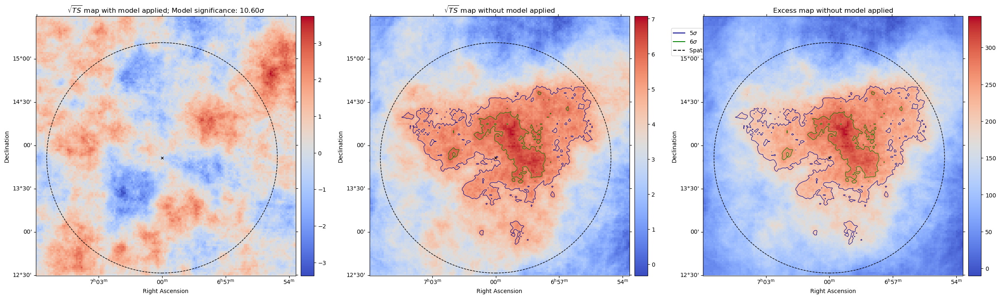

In [1702]:
# Model center's
lon_model_all = sky_model_all.spatial_model.lon_0.value
lat_model_all = sky_model_all.spatial_model.lat_0.value
position_model_all = SkyCoord(lon_model_all, lat_model_all, frame='icrs', unit='deg')

# Define center position marker
color_model = 'black'
center_marker = dict(marker='x', color=color_model, markersize=5)
model_legend = Line2D([0], [0], color=color_model, linestyle='--', label=rf'Spatial Model')

# Plotting
plt.figure(figsize=(40, 10))

################################################################################################################################
ax1 = plt.subplot(141, projection=significance_map_all.geom.wcs)
ax1.set_title(rf"$\sqrt{{TS}}$ map with model applied; Model significance: {significance_model:.2f}$\sigma$")
significance_map_all.plot(ax=ax1, add_cbar=True, cmap='coolwarm')

# Plot the regions of the models
ax1.plot(position_model_all.ra.deg, position_model_all.dec.deg, **center_marker, transform=ax1.get_transform('world'))
dataset_one_model.models.plot_regions(ax=ax1, color=color_model, ls='--')

################################################################################################################################
ax2 = plt.subplot(142, projection=significance_map_without_model.geom.wcs)
ax2.set_title(r"$\sqrt{TS}$ map without model applied")

significance_map_without_model.plot(ax=ax2, add_cbar=True, cmap='coolwarm')

# Plot in the 5 & 6 sigma contours
sigma_level = [5, 6]  
color = ['darkblue', 'green']
significance_array = np.squeeze(significance_map_without_model)
contours = ax2.contour(significance_array, levels=sigma_level, colors=color, linewidths = .75)
contour_legend = Line2D([0], [0], color=color[0], label=rf'{sigma_level[0]}$\sigma$')
contour_legend_1 = Line2D([0], [0], color=color[1], label=rf'{sigma_level[1]}$\sigma$')
ax2.legend(handles=[contour_legend,
                    contour_legend_1,
                    model_legend
                   ],
           loc='center left',
           bbox_to_anchor=(1.15, 0.9))

# Plot the regions of the models
ax2.plot(position_model_all.ra.deg, position_model_all.dec.deg, **center_marker, transform=ax2.get_transform('world'), zorder = 10)
dataset_one_model.models.plot_regions(ax=ax2, color=color_model, ls='--')

################################################################################################################################
ax3 = plt.subplot(143, projection=excess_map_without_model.geom.wcs)
ax3.set_title(r"Excess map without model applied")

excess_map_without_model.plot(ax=ax3, add_cbar=True, cmap='coolwarm')
contours = ax3.contour(significance_array, levels=sigma_level, colors=color, linewidths = .75)
ax3.plot(position_model_all.ra.deg, position_model_all.dec.deg, **center_marker, transform=ax3.get_transform('world'), zorder = 10)
dataset_one_model.models.plot_regions(ax=ax3, color=color_model, ls='--')

# muf.save_figures('{}/'.format(Plot_Dir_all), name='one_model_total_comparsion_with_and_without_model_ts_maps')

plt.show()

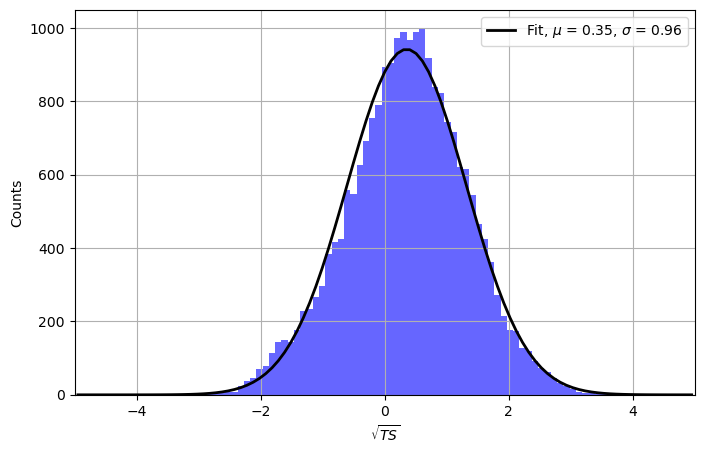

In [1703]:
mask = np.isfinite(significance_map_all.data) 
significance_data = significance_map_all.data[mask]

plt.figure(figsize=(8, 5))

bins = np.linspace(-5, 5, 100)
n, bins_, _ = plt.hist(significance_data, bins=bins, color='blue', alpha=0.6, lw=2, zorder=1)
x_vals = 0.5 * (bins_[:-1] + bins_[1:])
mu, std = norm.fit(significance_data)
y = norm.pdf(x_vals, mu, std) * sum(n * np.diff(bins_))

plt.plot(x_vals, y, lw=2, color="black", label=r"Fit, $\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu, std))

plt.legend()
plt.xlim(-5, 5)
plt.xlabel(r'$\sqrt{TS}$')
plt.ylabel('Counts')
plt.grid()

# muf.save_figures('{}/'.format(Plot_Dir_all), name='one_model_sqrt_ts_histogram_with_model')

plt.show()

### Flux Points

In [1704]:
energy_edges = MapAxis.from_energy_bounds("1 TeV", "15 TeV", nbin=5).edges

fpe_all = FluxPointsEstimator(energy_edges=energy_edges, source='Source model all')

flux_points_all = fpe_all.run(datasets=[dataset_one_model])

flux_points_container = [flux_points_all]

flux_names = ['flux_points_all']

In [1705]:
chi2_values = chi_squared_calculator(flux_points_all, flux_names)

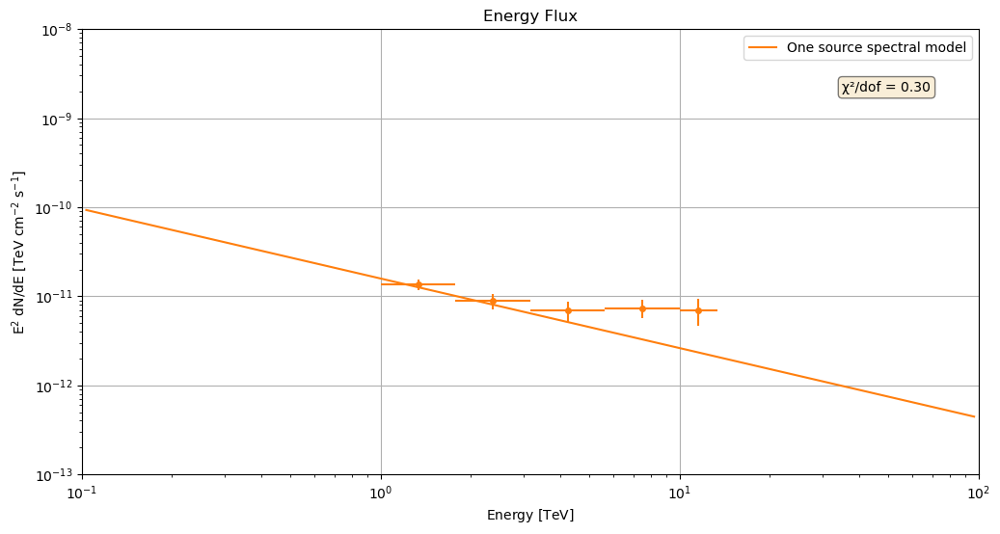

In [1706]:
plt.figure(figsize=(12, 6))
ax = plt.subplot()
ax.set_title('Energy Flux')


flux_points_number = len(np.where(flux_points_all.e2dnde.data[:,0][:,0] > 1e-12)[0])

free_model_params = len(spectral_model_all.parameters.free_parameters)

DOF = flux_points_number - free_model_params

# Extract flux values
chi_all = chi2_values[flux_names[0]] / DOF

# Plot the spectra
plot_spectrum(sky_model_all, flux_points_all, energy_power=2, label="One source spectral model", color='tab:orange')

# Add text with χ² value (assuming `result` is defined elsewhere in your code)
box_style = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
text_str = (f'χ²/dof = {chi_all:.2f}')

ax.text(35, 2e-9, text_str, color='black', size=10, bbox=box_style)

# Add legend and grid
ax.legend(bbox_to_anchor=(1, 1))
ax.grid()

# Set axis limits
ax.set_xlim(1e-1, 1e2)
ax.set_ylim(1e-13, 1e-8)

plt.subplots_adjust(hspace=.25)

# muf.save_figures('{}/'.format(Plot_Dir_all), name='one_model_energy_flux')

plt.show()

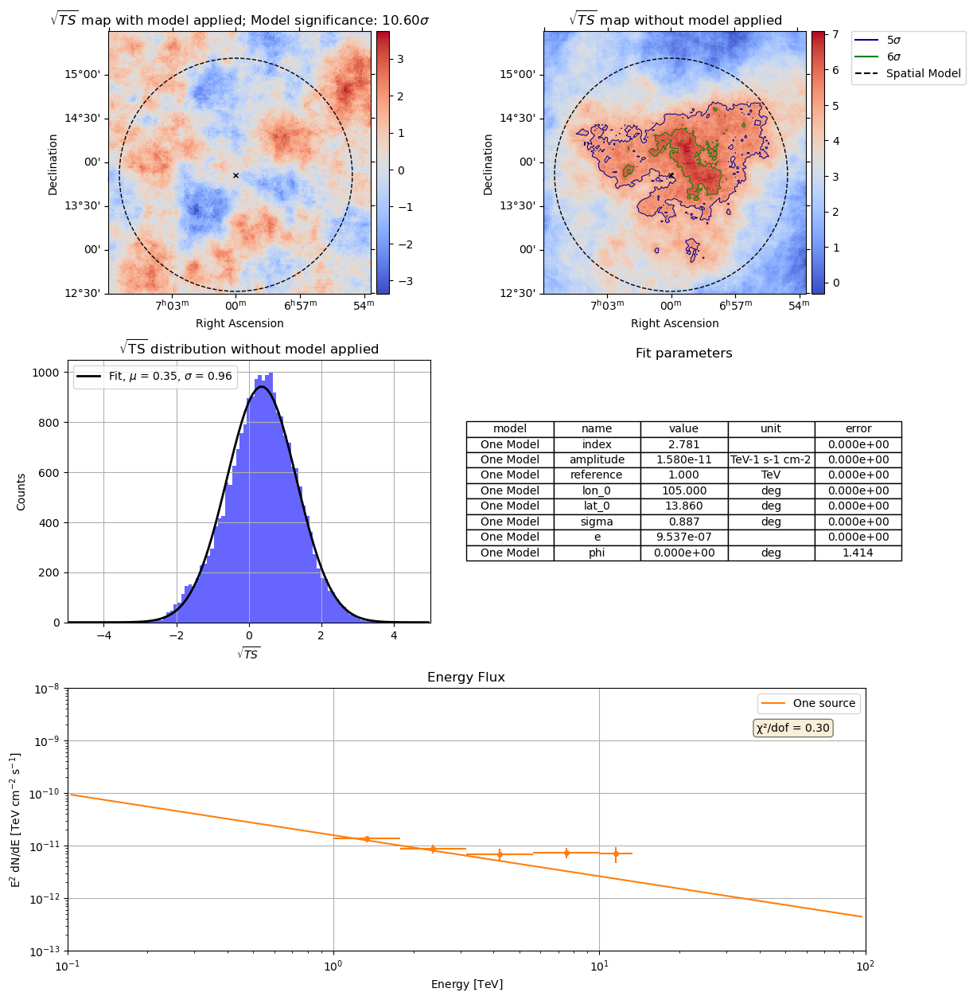

In [1707]:
# Plotting
plt.figure(figsize=(20, 15))
gs = GridSpec(3, 3, height_ratios=[1, 1, 1])  

# Model center's
lon_model_all = sky_model_all.spatial_model.lon_0.value
lat_model_all = sky_model_all.spatial_model.lat_0.value
position_model_all = SkyCoord(lon_model_all, lat_model_all, frame='icrs', unit='deg')

# Define center position marker
color_model = 'black'
center_marker = dict(marker='x', color=color_model, markersize=5)
model_legend = Line2D([0], [0], color=color_model, linestyle='--', label=rf'Spatial Model')

################################################################################################################################
ax1 = plt.subplot(gs[0, 0], projection=significance_map_all.geom.wcs)
ax1.set_title(rf"$\sqrt{{TS}}$ map with model applied; Model significance: {significance_model:.2f}$\sigma$")
significance_map_all.plot(ax=ax1, add_cbar=True, cmap='coolwarm')#, vmin=-1, vmax=1)

# Plot the regions of the models
ax1.plot(position_model_all.ra.deg, position_model_all.dec.deg, **center_marker, transform=ax1.get_transform('world'))
dataset_one_model.models.plot_regions(ax=ax1, color=color_model, ls='--')

################################################################################################################################
ax2 = plt.subplot(gs[0, 1], projection=significance_map_without_model.geom.wcs)
ax2.set_title(r"$\sqrt{TS}$ map without model applied")

significance_map_without_model.plot(ax=ax2, add_cbar=True, cmap='coolwarm')#, vmin=-2, vmax=7)

# Plot in the 5 & 6 sigma contours
sigma_level = [5, 6]  
color = ['darkblue', 'green']
significance_array = np.squeeze(significance_map_without_model)
contours = ax2.contour(significance_array, levels=sigma_level, colors=color, linewidths = .75)
contour_legend = Line2D([0], [0], color=color[0], label=rf'{sigma_level[0]}$\sigma$')
contour_legend_1 = Line2D([0], [0], color=color[1], label=rf'{sigma_level[1]}$\sigma$')
ax2.legend(handles=[contour_legend, contour_legend_1, model_legend], loc='center left', bbox_to_anchor=(1.15, 0.9))

# Plot the regions of the models
ax2.plot(position_model_all.ra.deg, position_model_all.dec.deg, **center_marker, transform=ax2.get_transform('world'), zorder = 10)
dataset_one_model.models.plot_regions(ax=ax2, color=color_model, ls='--')

################################################################################################################################
ax3 = plt.subplot(gs[1, 0]) 
ax3.set_title(rf"$\sqrt{{\rm TS}}$ distribution without model applied")
mask = np.isfinite(significance_map_all.data) 
significance_data = significance_map_all.data[mask]
bins = np.linspace(-5, 5, 100)
n, bins_, _ = plt.hist(significance_data, bins=bins, color='blue', alpha=0.6, lw=2, zorder=1)
x_vals = 0.5 * (bins_[:-1] + bins_[1:])
mu, std = norm.fit(significance_data)
y = norm.pdf(x_vals, mu, std) * sum(n * np.diff(bins_))

plt.plot(x_vals, y, lw=2, color="black", label=r"Fit, $\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu, std))

plt.legend()
plt.xlim(-5, 5)
plt.xlabel(r'$\sqrt{TS}$')
plt.ylabel('Counts')
plt.grid()

################################################################################################################################
# Add the table in ax4
ax4 = plt.subplot(gs[1, 1])
ax4.axis('off')
ax4.set_title('Fit parameters', fontsize=12, pad=-10)  # Adjust the title and padding as needed

# Format and display the table
def format_value(val):
    if pd.isna(val):
        return ''
    elif isinstance(val, float):
        if abs(val) < 1e-3 or abs(val) > 1e3:
            return f'{val:.3e}'
        else:
            return f'{val:.3f}'
    return str(val)

# Update the 'model' column with new names
df_all.loc[df_all['model'] == 'Source model all', 'model'] = 'One Model'
df_all.loc[df_all['model'] == 'Monogem_stacked_Dataset-bkg', 'model'] = 'Bkg Model'

df_formatted = df_all[['model', 'name', 'value', 'unit', 'error']].applymap(format_value)
table_data = df_formatted.values
columns = df_formatted.columns

table_plot = ax4.table(cellText=table_data, colLabels=columns, cellLoc='center', loc='center')

# Set table style
table_plot.auto_set_font_size(False)
table_plot.set_fontsize(10)
table_plot.scale(1.2, 1.2)  # Adjust the scale as needed

################################################################################################################################
# Create the subplot
ax5 = plt.subplot(gs[2, :2])
ax5.set_title('Energy Flux')

# Plot the spectra
plot_spectrum(sky_model_all, flux_points_all, energy_power=2, label="One source", color='tab:orange')

# Add text with χ² value (assuming `result` is defined elsewhere in your code)
box_style = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
text_str = (f'χ²/dof = {chi_all:.2f}')

ax5.text(39, 1.5e-9, text_str, color='black', size=10, bbox=box_style)

# Add legend and grid
ax5.legend(bbox_to_anchor=(1, 1))
ax5.grid()

# Set axis limits
ax5.set_xlim(1e-1, 1e2)
ax5.set_ylim(1e-13, 1e-8)

plt.subplots_adjust(hspace=.25)

# muf.save_figures('{}/'.format(Plot_Dir_all), name='OVERVIEW_zoomed')

plt.show()

In [1625]:
mask = np.where(flux_points_all.e2dnde.data[:,0][:,0] > 1e-12)


flux_points = flux_points_all.dnde.data[:,0][:,0][mask]
flux_points_error = flux_points_all.dnde_err.data[:,0][:,0][mask]

ref_energy = np.array(flux_points_all.to_table()['e_ref'][mask])
ref_energy_min = np.array(flux_points_all.to_table()['e_min'][mask])
ref_energy_max = np.array(flux_points_all.to_table()['e_max'][mask])

data_table = table.Table([ref_energy, ref_energy_min, ref_energy_max, flux_points, flux_points_error], 
            names=('energy', 'energy_edge_lo', 'energy_edge_hi', 'flux', 'flux_error'))

# Assigning units to each column
data_table['energy'].unit = u.TeV  # Example unit for energy
data_table['energy_edge_lo'].unit = u.TeV  # Same unit for energy edges
data_table['energy_edge_hi'].unit = u.TeV  # Same unit for energy edges
data_table['flux'].unit = u.Unit('1 / (TeV cm2 s)')  # Example unit for flux
data_table['flux_error'].unit = u.Unit('1 / (TeV cm2 s)')  # Same unit for flux error


# Saving the table as an ECSV file
data_table.write('test/energy_flux_data.ecsv', format='ascii.ecsv', overwrite = True)